***Student: Yang Ma- xxxxx***

# Init Code

In [ ]:
import collections
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import gzip
import urllib.request
import seaborn as sns
from collections import Counter
from collections import defaultdict
from matplotlib.animation import FuncAnimation
from scipy.stats import linregress

def print_graph_stats(title, g):
    print("Simple stats for: " + title)
    print("# of nodes: " + str(len(g.nodes())))
    print("# of edges: " + str(len(g.edges())))
    print("Is graph connected? " + str(nx.is_connected(g)))

numberL = ['04', '05', '06', '08','09', '24', '25', '30', '31']
urlLeft = 'http://snap.stanford.edu/data/p2p-Gnutella'
urlRight = '.txt.gz'
nameL = 'p2p-Gnutella'
nameR = '.txt'
Gs = []
for number in numberL:
  url = urlLeft + number + urlRight
  name = nameL + number + nameR
  # Download file from SNAP and uncompress it.
  response = urllib.request.urlopen(url)
  with open(name, 'wb') as outfile:
    outfile.write(gzip.decompress(response.read()))
  G = nx.read_edgelist(name)
  print_graph_stats("Gnutella p2p graph", G)
  Gs.append(G)

Simple stats for: Gnutella p2p graph
# of nodes: 10876
# of edges: 39994
Is graph connected? True
Simple stats for: Gnutella p2p graph
# of nodes: 8846
# of edges: 31839
Is graph connected? False
Simple stats for: Gnutella p2p graph
# of nodes: 8717
# of edges: 31525
Is graph connected? True
Simple stats for: Gnutella p2p graph
# of nodes: 6301
# of edges: 20777
Is graph connected? False
Simple stats for: Gnutella p2p graph
# of nodes: 8114
# of edges: 26013
Is graph connected? False
Simple stats for: Gnutella p2p graph
# of nodes: 26518
# of edges: 65369
Is graph connected? False
Simple stats for: Gnutella p2p graph
# of nodes: 22687
# of edges: 54705
Is graph connected? False
Simple stats for: Gnutella p2p graph
# of nodes: 36682
# of edges: 88328
Is graph connected? False
Simple stats for: Gnutella p2p graph
# of nodes: 62586
# of edges: 147892
Is graph connected? False


# The Crawler

It joins the network as a servent and utilise the Ping-Pong mechanism to find other hosts. The authors of the paper originally decided to use multiple crawlers finding the nodes simultaneously. However, the network is dynamic, they need to find a trade-off between hosts discovery time vs. invasiveness of the crawler.

**Assumption**: The hosts that the crawler discovered but failed to connect to are not included in the graph. These hosts either have a TCP connection limit or left the network when the crawler tries to connect.

# Analysis

## How does the largest components changes over time?

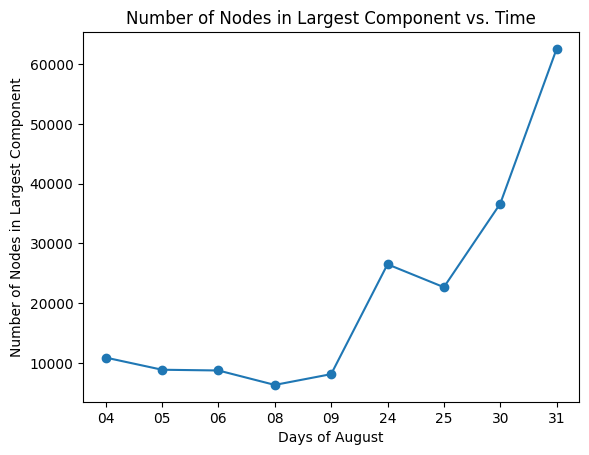

In [ ]:
# Given time points
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']

# Function to get the number of nodes in the largest connected component
def get_largest_component_size(G):
    components = sorted(nx.connected_components(G), key=len, reverse=True)
    largest_component = components[0]
    return len(largest_component)

# Calculate the number of nodes in the largest components for each graph
num_nodes_largest_components = [get_largest_component_size(G) for G in Gs]

# Plot the number of nodes in the largest components versus time points
plt.plot(time_points, num_nodes_largest_components, marker='o')
plt.xlabel('Days of August')
plt.ylabel('Number of Nodes in Largest Component')
plt.title('Number of Nodes in Largest Component vs. Time')
plt.show()

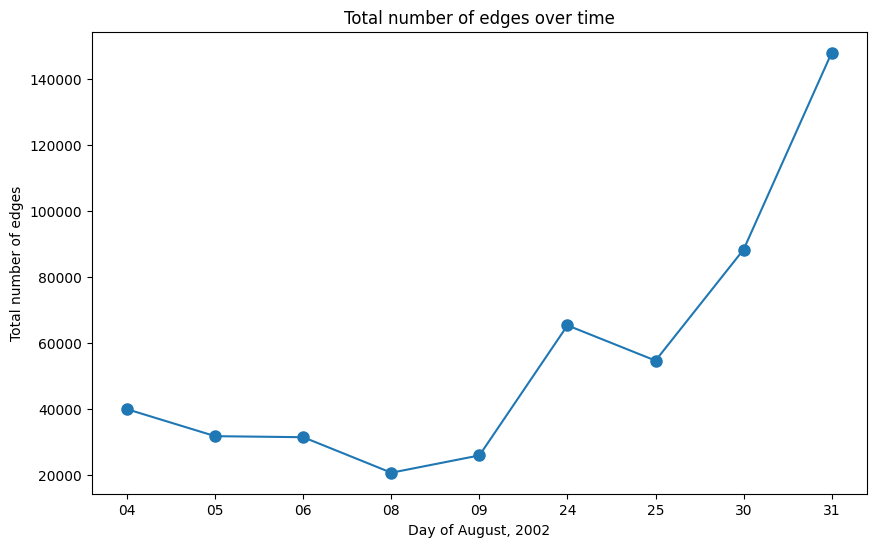

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']
graph_stats = [
    (10876, 39994),
    (8846, 31839),
    (8717, 31525),
    (6301, 20777),
    (8114, 26013),
    (25518, 65369),
    (22687, 54705),
    (36682, 88328),
    (62586, 147892),
]

# Extract the number of edges from graph_stats
number_of_edges = [stat[1] for stat in graph_stats]

# Plot the number of edges over time
plt.figure(figsize=(10, 6))
plt.plot(time_points, number_of_edges, 'o-', markersize=8)
plt.xlabel('Day of August, 2002')
plt.ylabel('Total number of edges')
plt.title('Total number of edges over time')
plt.show()

## Sparsity

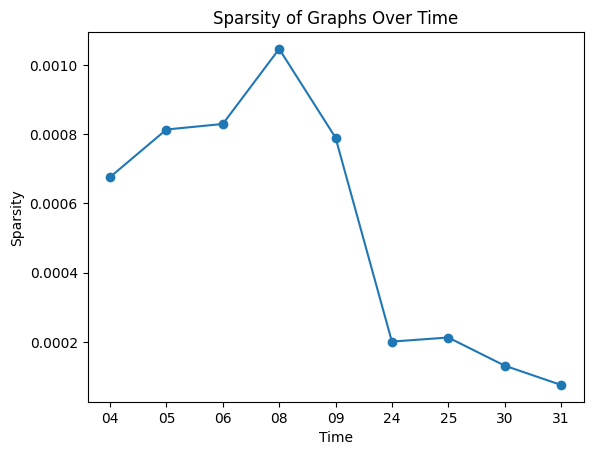

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']

# Assuming the list of (number_of_nodes, number_of_edges) tuples
graph_stats = [
    (10876, 39994),
    (8846, 31839),
    (8717, 31525),
    (6301, 20777),
    (8114, 26013),
    (25518, 65369),
    (22687, 54705),
    (36682, 88328),
    (62586, 147892),
]

# calculate sparsity values
sparsity_values = [
    (2 * num_edges) / (num_nodes * (num_nodes - 1))
    for num_nodes, num_edges in graph_stats
]

# plot sparsity values against time points
plt.plot(time_points, sparsity_values, marker='o', linestyle='-')
plt.xlabel("Time")
plt.ylabel("Sparsity")
plt.title("Sparsity of Graphs Over Time")
plt.show()

## Avg. degree over time of the month in August, 2002

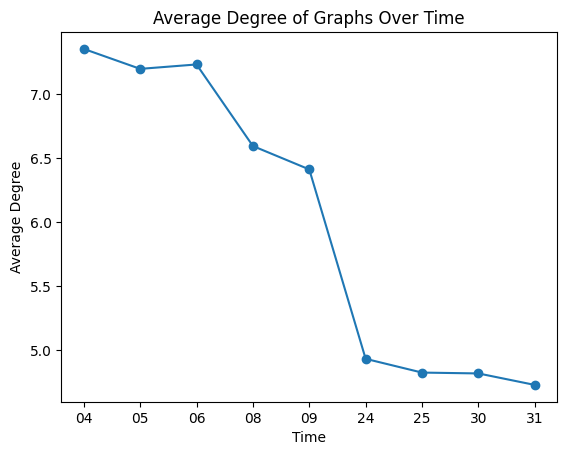

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']
#average degree values
average_degrees = [
    (2 * G.number_of_edges()) / G.number_of_nodes()
    for G in Gs
]
#plot average degree values vs. time points
plt.plot(time_points, average_degrees, marker='o', linestyle='-')
plt.xlabel("Time")
plt.ylabel("Average Degree")
plt.title("Average Degree of Graphs Over Time")
plt.show()

Second moment average degree for graph 0: 102.74
Second moment average degree for graph 1: 106.47
Second moment average degree for graph 2: 104.19
Second moment average degree for graph 3: 116.43
Second moment average degree for graph 4: 107.80
Second moment average degree for graph 5: 59.32
Second moment average degree for graph 6: 51.82
Second moment average degree for graph 7: 55.18
Second moment average degree for graph 8: 54.84


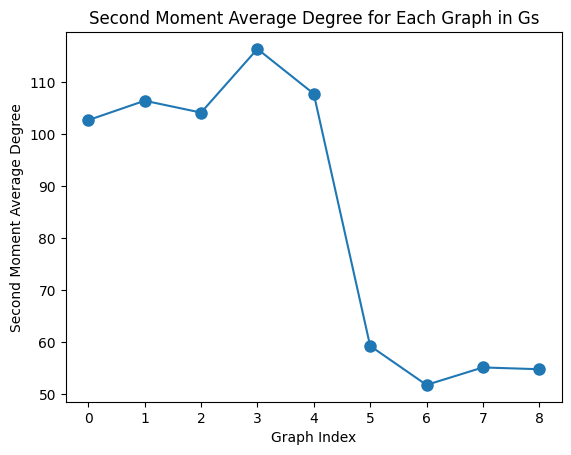

In [ ]:
def degree_distribution(G):
    degree_dict = dict(G.degree())
    degree_counts = {}

    for _, degree in degree_dict.items():
        if degree in degree_counts:
            degree_counts[degree] += 1
        else:
            degree_counts[degree] = 1

    degree_counts = {k: v / len(G) for k, v in degree_counts.items()}

    return degree_counts

second_moment_degrees = []

for G in Gs:
    degree_dist = degree_distribution(G)
    second_moment = sum(k ** 2 * Pk for k, Pk in degree_dist.items())
    second_moment_degrees.append(second_moment)

for i, second_moment_degree in enumerate(second_moment_degrees):
    print(f"Second moment average degree for graph {i}: {second_moment_degree:.2f}")

x = list(range(len(Gs)))
y = second_moment_degrees

plt.plot(x, y, marker='o', linestyle='-', markersize=8)
plt.title("Second Moment Average Degree for Each Graph in Gs")
plt.xlabel("Graph Index")
plt.ylabel("Second Moment Average Degree")
plt.show()

In [ ]:
def estimate_gamma(G):
    degrees = [degree for _, degree in G.degree()]
    k_min = np.min(degrees)
    n = len(degrees)
    gamma = 1 + n / np.sum(np.log(degrees / k_min))
    return gamma

degree_exponents = [estimate_gamma(G) for G in Gs]

for i, gamma in enumerate(degree_exponents):
    print(f"Degree Exponent (gamma) for graph {i}: {gamma}")

Degree Exponent (gamma) for graph 0: 1.6680029056518901
Degree Exponent (gamma) for graph 1: 1.6735141554045259
Degree Exponent (gamma) for graph 2: 1.673374365050985
Degree Exponent (gamma) for graph 3: 1.753738545725112
Degree Exponent (gamma) for graph 4: 1.7799648809789819
Degree Exponent (gamma) for graph 5: 1.9859177692770147
Degree Exponent (gamma) for graph 6: 1.9939394546240772
Degree Exponent (gamma) for graph 7: 2.0356848489649373
Degree Exponent (gamma) for graph 8: 2.062935369729094



Ref: Networksciencebook - Section 4.7
> Anomalous Regime (γ≤ 2): For γ ‹ 2 the exponent 1/(γ− 1) in (4.18) is larger than one, hence the number of links connected to the largest hub grows faster than the size of the network. This means that for sufficiently large N the degree of the largest hub must exceed the total number of nodes in the network, hence it will run out of nodes to connect to. Similarly, for γ ‹ 2 the average degree 〈k〉 diverges in the N → ∞ limit. These odd predictions are only two of the many anomalous features of scale-free networks in this regime. They are signatures of a deeper problem: Large scale-free network with γ ‹ 2, that lack multi-links, cannot exist (BOX 4.6).


> Scale-Free Regime (2 ‹ γ ‹ 3): In this regime the first moment of the degree distribution is finite but the second and higher moments diverge as N → ∞. Consequently scalefree networks in this regime are ultra-small (SECTION 4.6). Equation (4.18) predicts that kmax grows with the size of the network with exponent 1/(γ - 1), which is smaller than one. Hence the market share of the largest hub, kmax /N, representing the fraction of nodes that connect to it, decreases as kmax/N ~ N-(γ-2)/(γ-1).


## Diameter and 90-percentile effective diameter
The 90th percentile effective diameter is a measure of the efficiency of information flow in a network. It is defined as the shortest path length between a pair of nodes such that 90% of all pairs of nodes in the network can be reached within that path length or less.

In other words, the 90th percentile effective diameter measures the typical distance between nodes in a network, and is a way of quantifying how easily information can spread across the network.

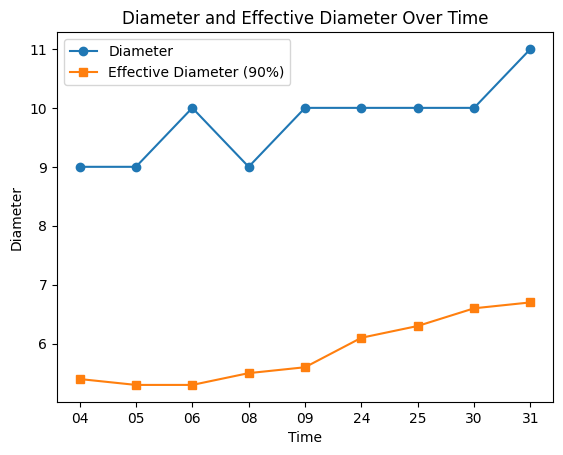

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']

diameters = [9, 9, 10, 9, 10, 10, 10, 10, 11]
effective_diameter_90_percent = [5.4, 5.3, 5.3, 5.5, 5.6, 6.1, 6.3, 6.6, 6.7]

plt.plot(time_points, diameters, marker='o', linestyle='-', label='Diameter')
plt.plot(time_points, effective_diameter_90_percent, marker='s', linestyle='-', label='Effective Diameter (90%)')
plt.xlabel("Time")
plt.ylabel("Diameter")
plt.title("Diameter and Effective Diameter Over Time")
plt.legend()
plt.show()

## Friendship Paradox

In [ ]:
def calculate_friendship_paradox(G):
    avg_degree = np.mean([d for n, d in G.degree()])
    avg_friends_degree = np.mean([np.mean([G.degree(neighbor) for neighbor in G.neighbors(node)]) for node in G.nodes()])
    return avg_degree, avg_friends_degree

friendship_paradox_data = []

for G in Gs:
    avg_degree, avg_friends_degree = calculate_friendship_paradox(G)
    friendship_paradox_data.append((avg_degree, avg_friends_degree))

for i, (avg_degree, avg_friends_degree) in enumerate(friendship_paradox_data, 1):
    print(f"Graph {i}: Average degree = {avg_degree:.2f}, Average friends' degree = {avg_friends_degree:.2f}")

Graph 1: Average degree = 7.35, Average friends' degree = 14.18
Graph 2: Average degree = 7.20, Average friends' degree = 14.38
Graph 3: Average degree = 7.23, Average friends' degree = 14.26
Graph 4: Average degree = 6.59, Average friends' degree = 15.78
Graph 5: Average degree = 6.41, Average friends' degree = 15.38
Graph 6: Average degree = 4.93, Average friends' degree = 13.12
Graph 7: Average degree = 4.82, Average friends' degree = 12.47
Graph 8: Average degree = 4.82, Average friends' degree = 13.05
Graph 9: Average degree = 4.73, Average friends' degree = 13.21


## Degree assortativity - correlations

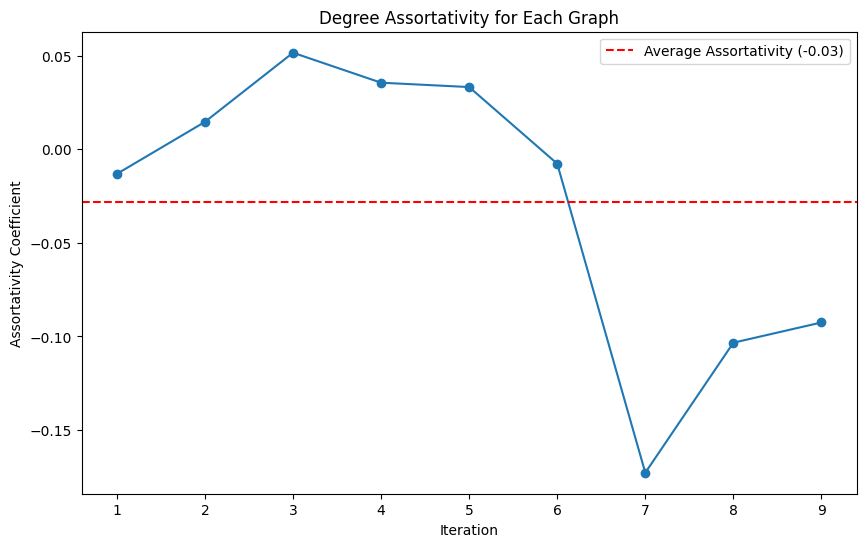

In [ ]:
# calculation
assortativity_coeffs = [nx.degree_assortativity_coefficient(G) for G in Gs]
average_assortativity = np.mean(assortativity_coeffs)

# plot the assortativity for each graph
iterations = list(range(1, len(Gs) + 1))
plt.figure(figsize=(10, 6))
plt.plot(iterations, assortativity_coeffs, marker='o', linestyle='-')
plt.axhline(y=average_assortativity, color='r', linestyle='--', label=f'Average Assortativity ({average_assortativity:.2f})')
plt.xlabel('Iteration')
plt.ylabel('Assortativity Coefficient')
plt.title('Degree Assortativity for Each Graph')
plt.xticks(iterations)
plt.legend()
plt.show()

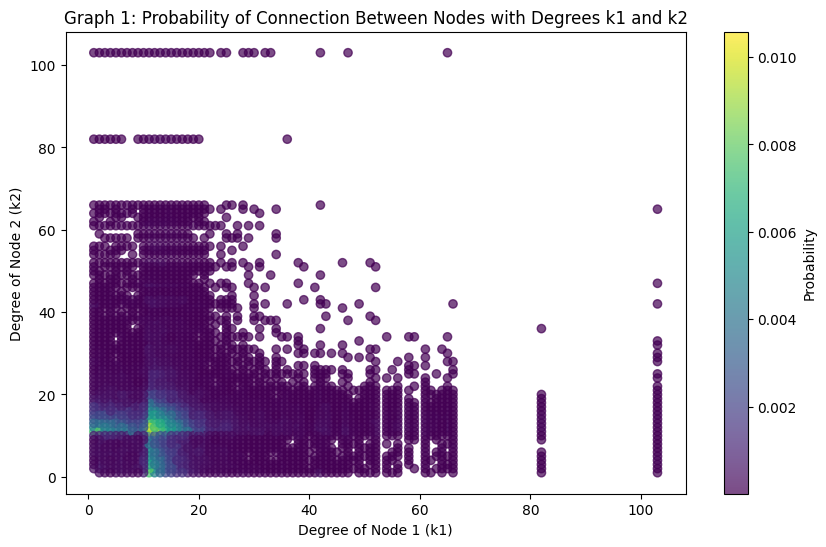

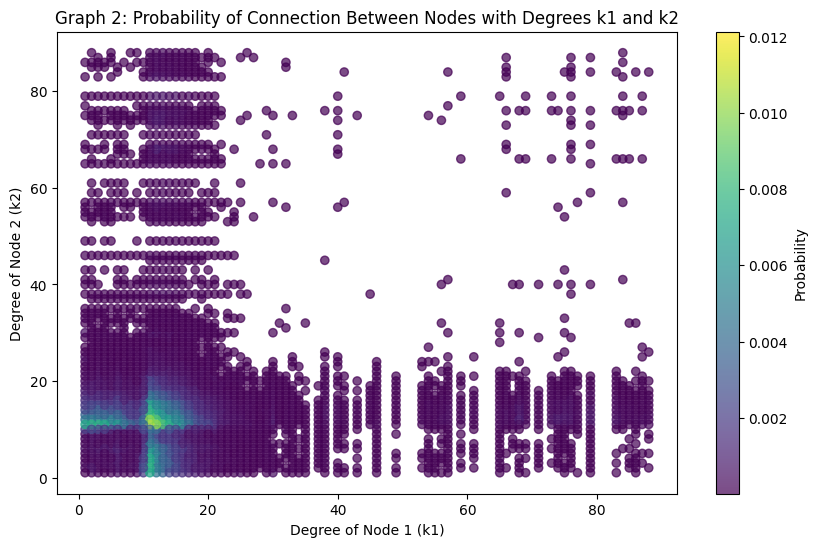

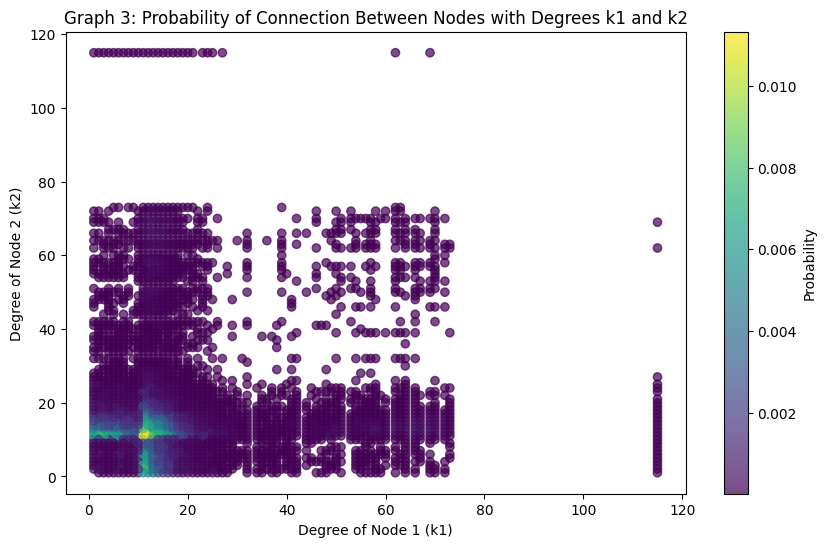

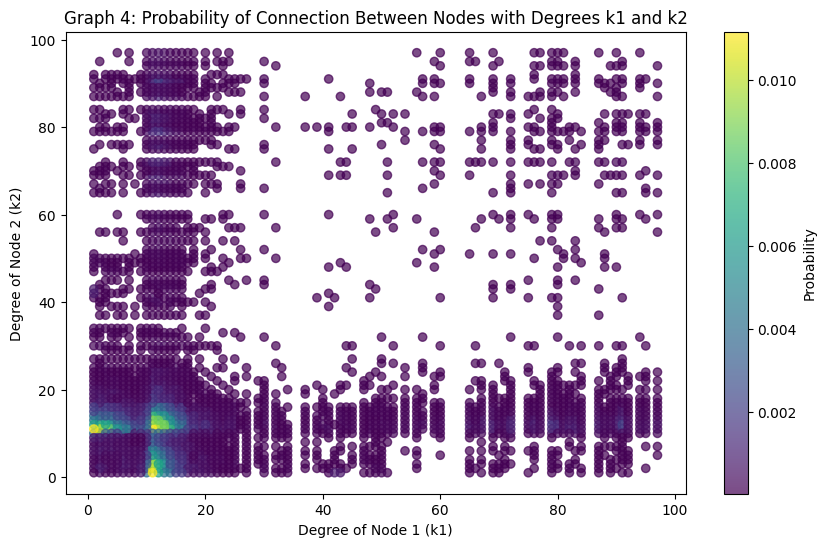

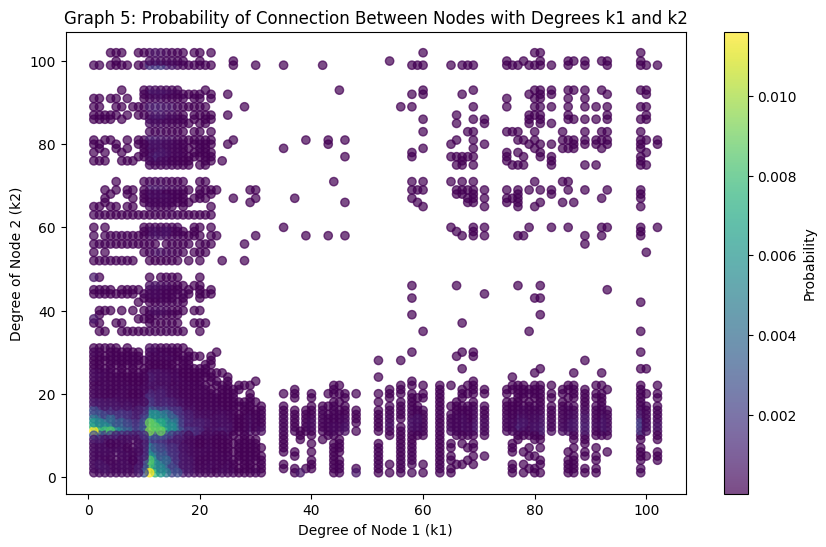

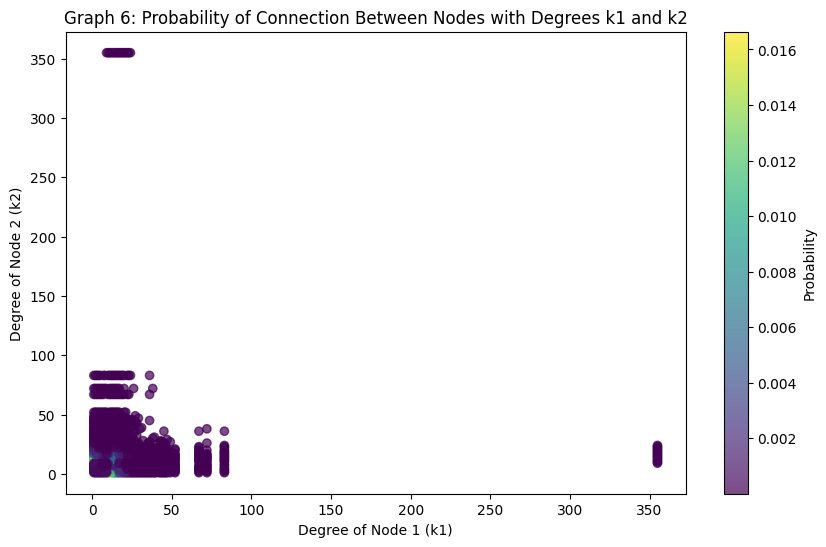

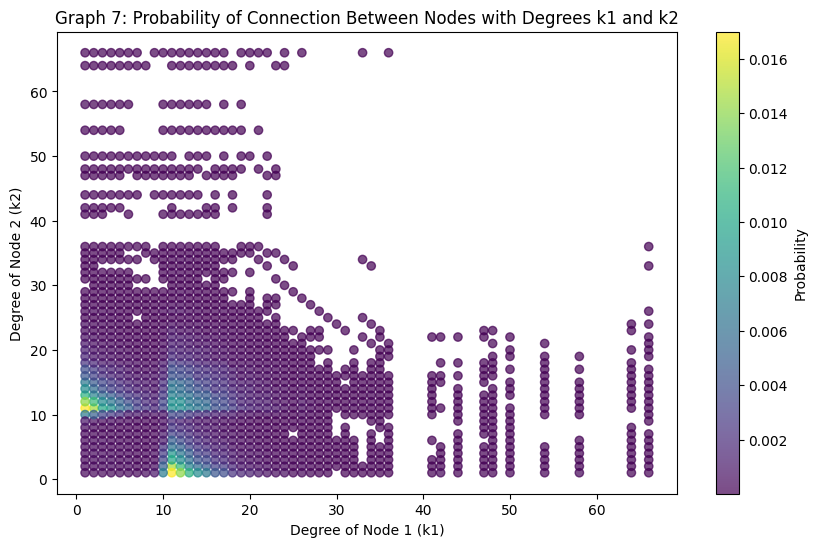

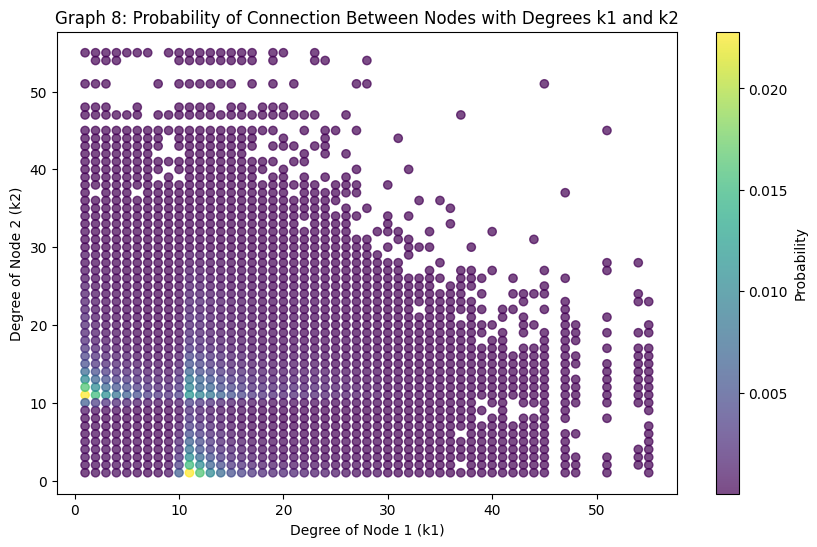

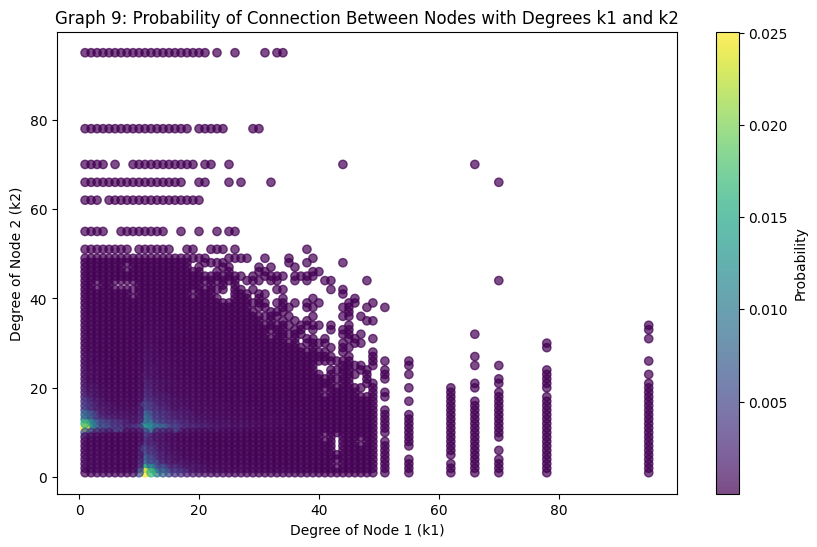

In [ ]:

def plot_joint_degree_prob(G, index):
    joint_degree_dist = defaultdict(int)
    for u, v in G.edges():
        k1, k2 = G.degree(u), G.degree(v)
        joint_degree_dist[(k1, k2)] += 1
        joint_degree_dist[(k2, k1)] += 1

    total_links = sum(joint_degree_dist.values())
    joint_degree_prob = {k: v / total_links for k, v in joint_degree_dist.items()}

    x, y = zip(*joint_degree_prob.keys())
    colors = [joint_degree_prob[k] for k in joint_degree_prob]

    plt.figure(figsize=(10, 6))
    sc = plt.scatter(x, y, c=colors, alpha=0.7, cmap='viridis')
    plt.xlabel('Degree of Node 1 (k1)')
    plt.ylabel('Degree of Node 2 (k2)')
    plt.title(f'Graph {index}: Probability of Connection Between Nodes with Degrees k1 and k2')
    plt.colorbar(sc, label='Probability')
    plt.show()

for i, G in enumerate(Gs):
    plot_joint_degree_prob(G, i+1)


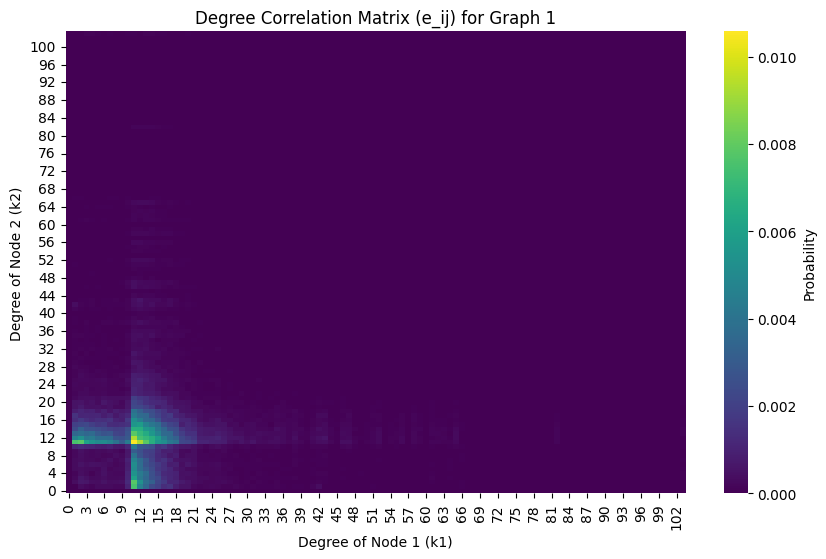

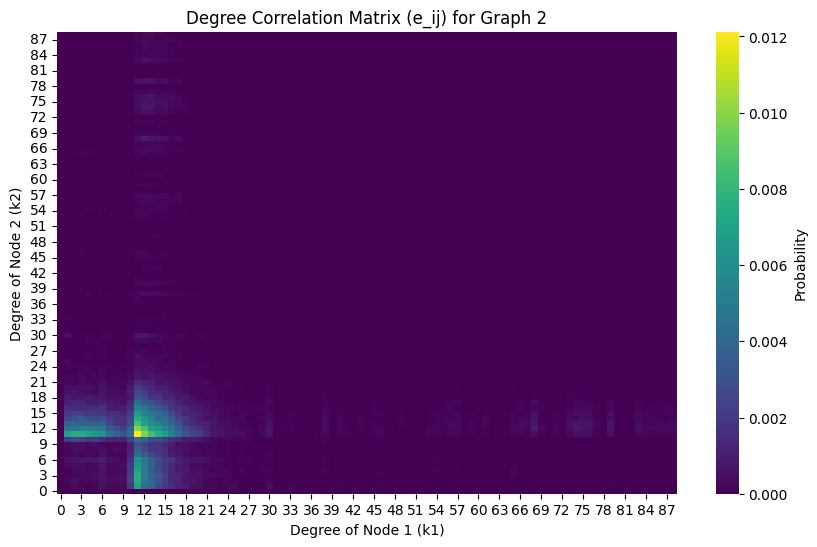

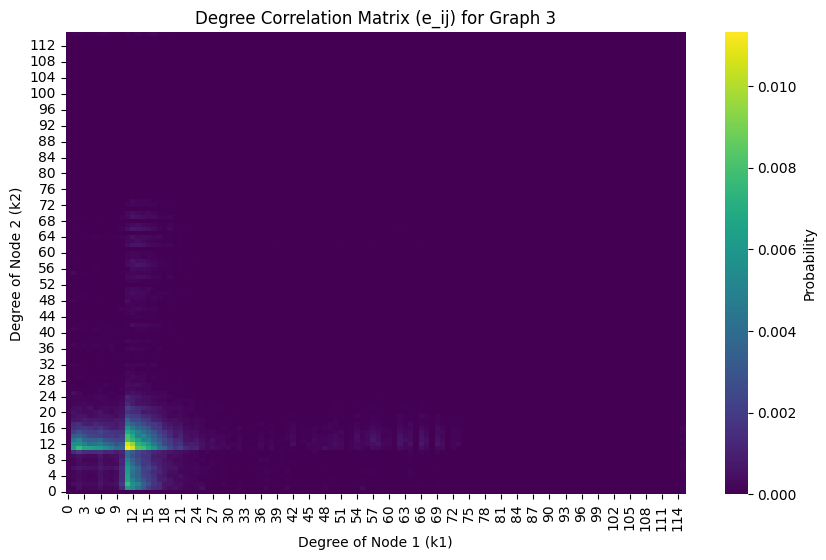

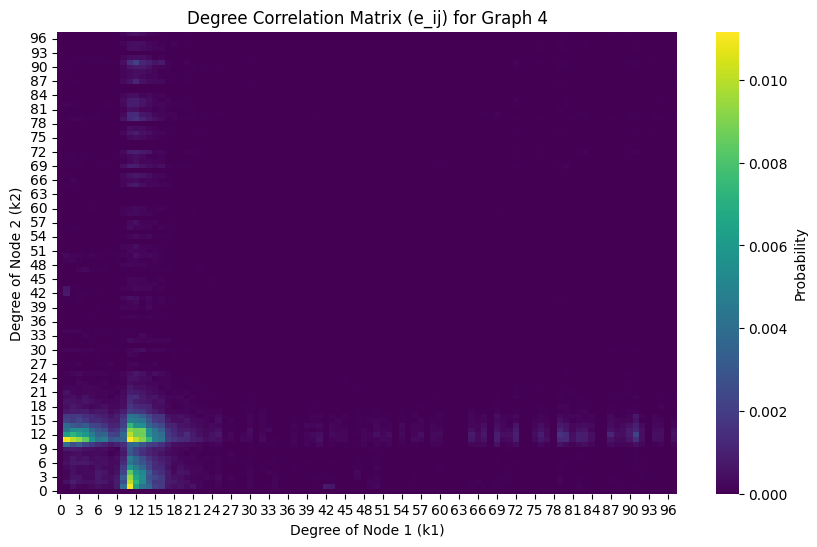

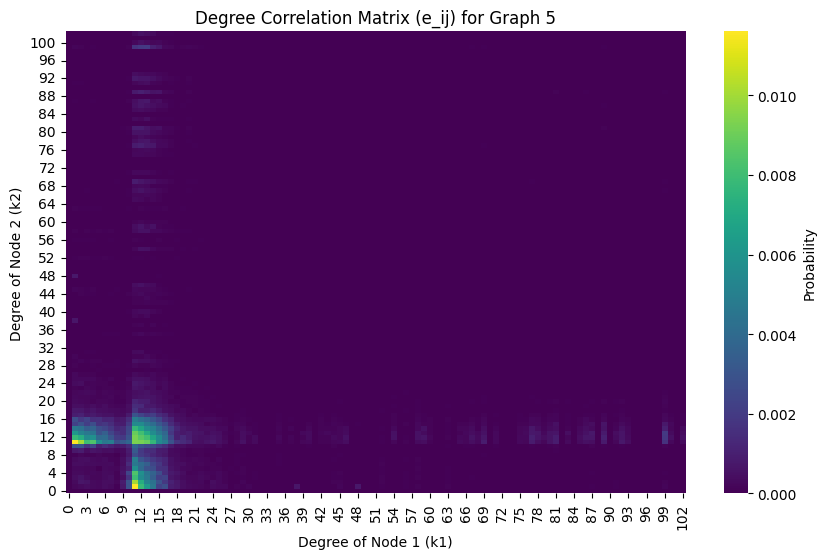

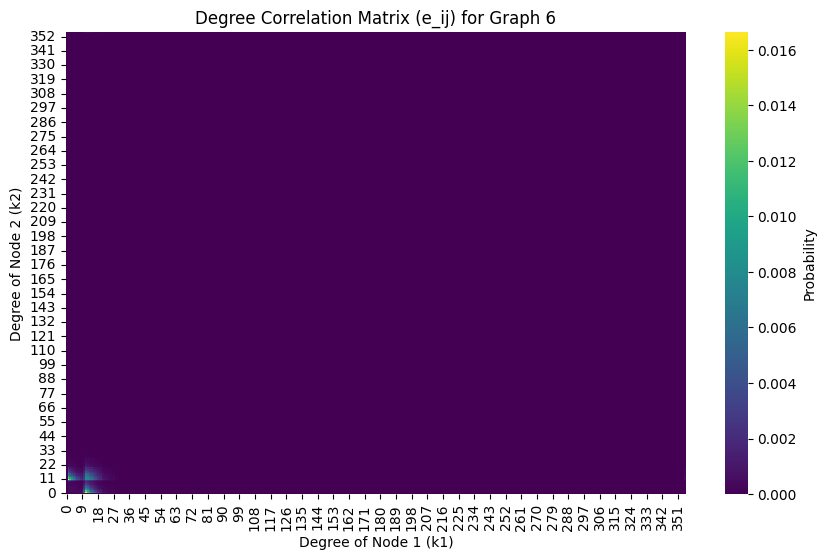

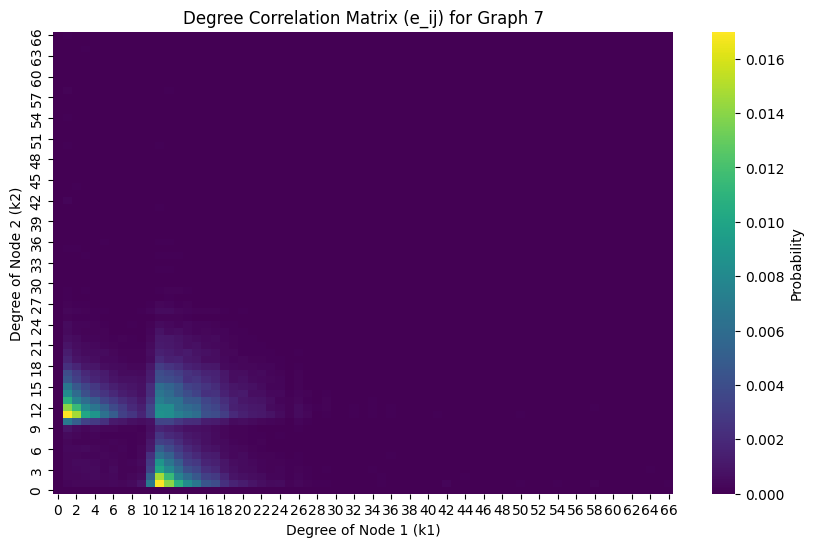

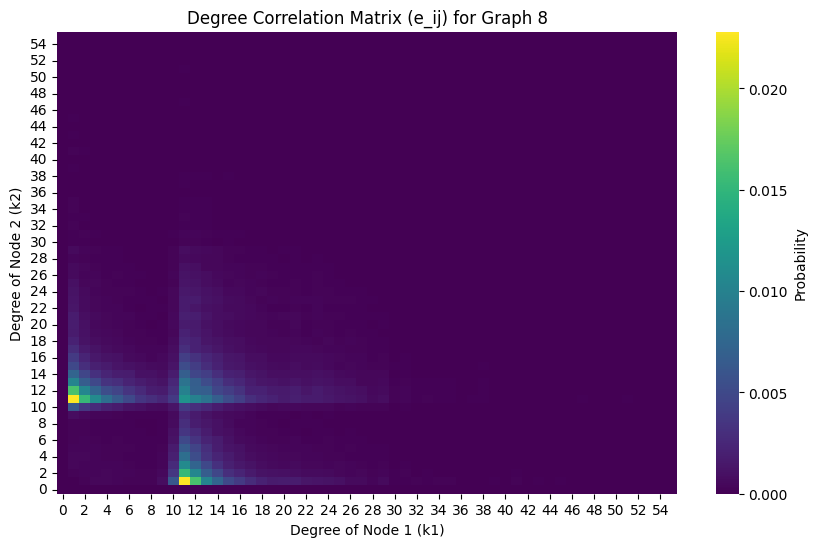

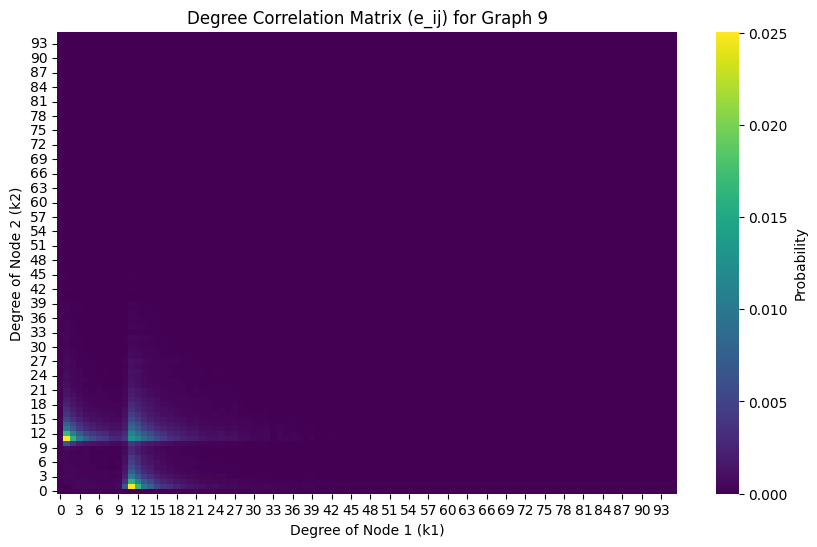

In [ ]:


def degree_correlation_matrix(G):
    joint_degree_dist = defaultdict(int)
    for u, v in G.edges():
        k1, k2 = G.degree(u), G.degree(v)
        joint_degree_dist[(k1, k2)] += 1
        joint_degree_dist[(k2, k1)] += 1

    total_links = sum(joint_degree_dist.values())
    max_degree = max(dict(G.degree()).values())
    e_ij = np.zeros((max_degree + 1, max_degree + 1))

    for (k1, k2), count in joint_degree_dist.items():
        e_ij[k1, k2] = count / total_links

    return e_ij

for i, G in enumerate(Gs):
    e_ij = degree_correlation_matrix(G)

    plt.figure(figsize=(10, 6))
    sns.heatmap(e_ij, cmap='viridis', cbar_kws={'label': 'Probability'})
    plt.xlabel('Degree of Node 1 (k1)')
    plt.ylabel('Degree of Node 2 (k2)')
    plt.title(f'Degree Correlation Matrix (e_ij) for Graph {i + 1}')
    plt.gca().invert_yaxis()
    plt.show()


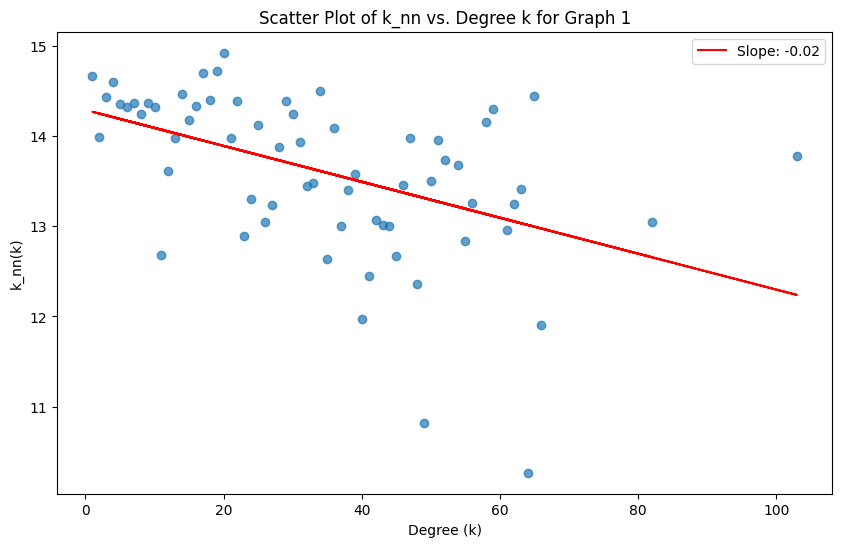

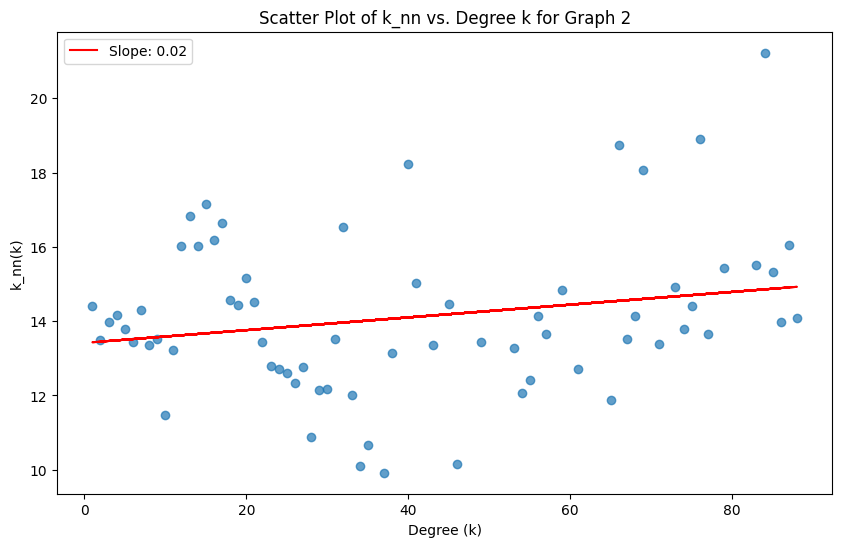

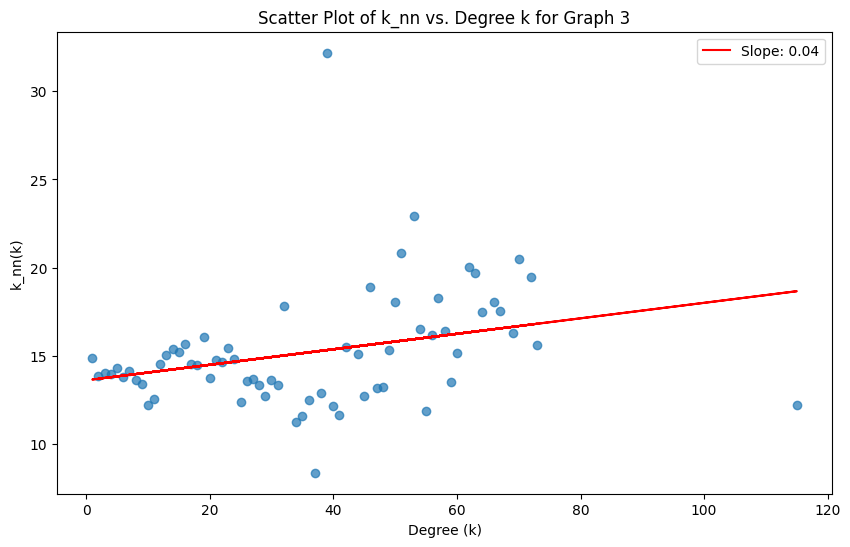

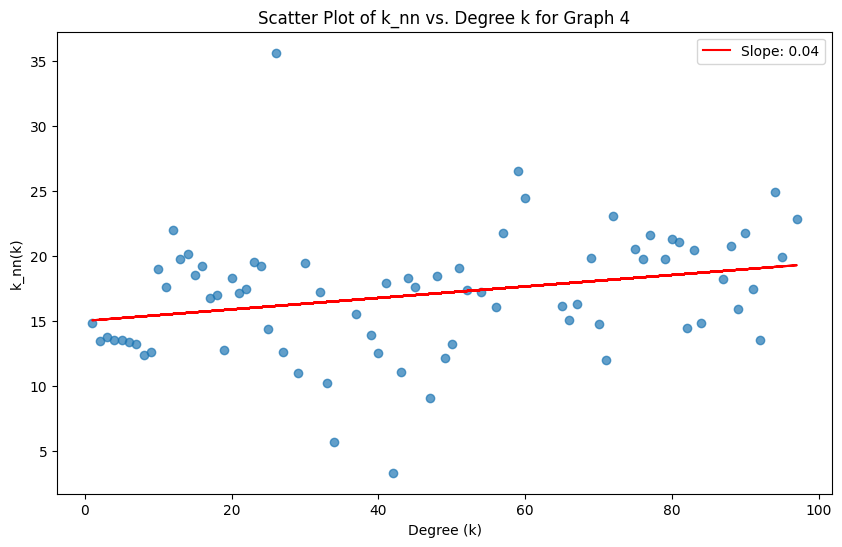

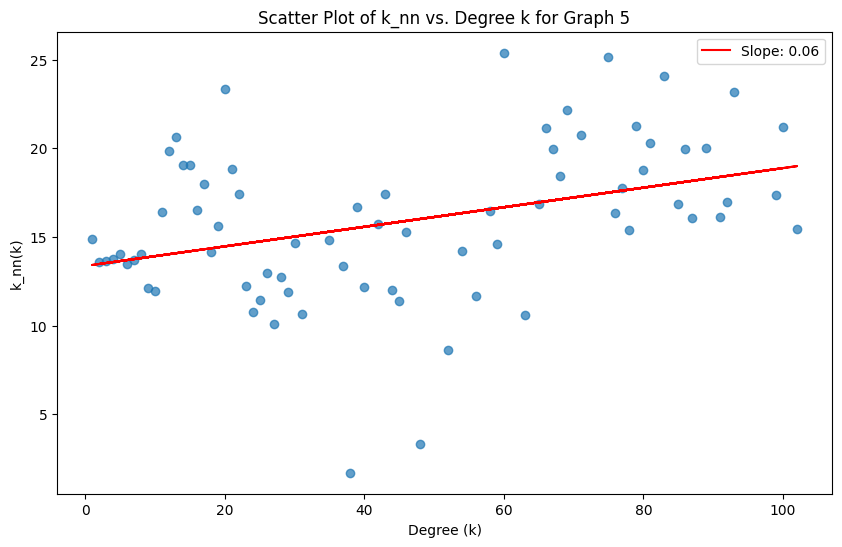

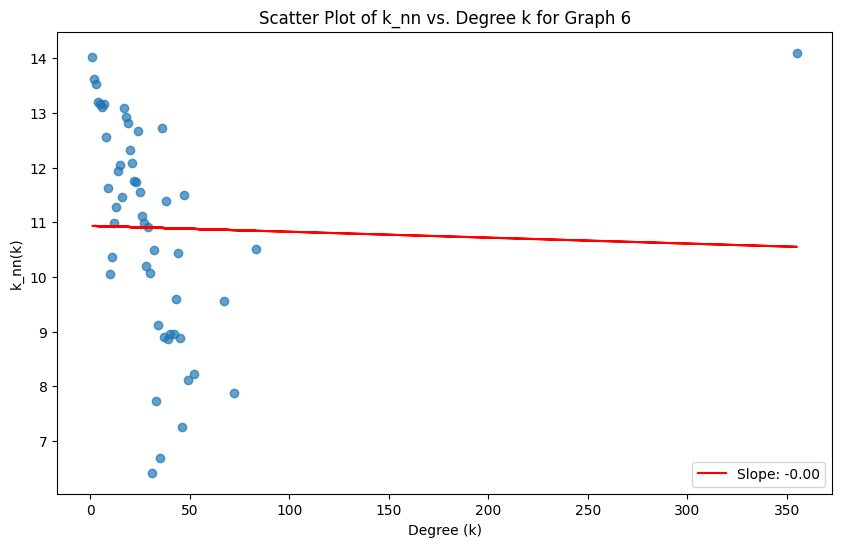

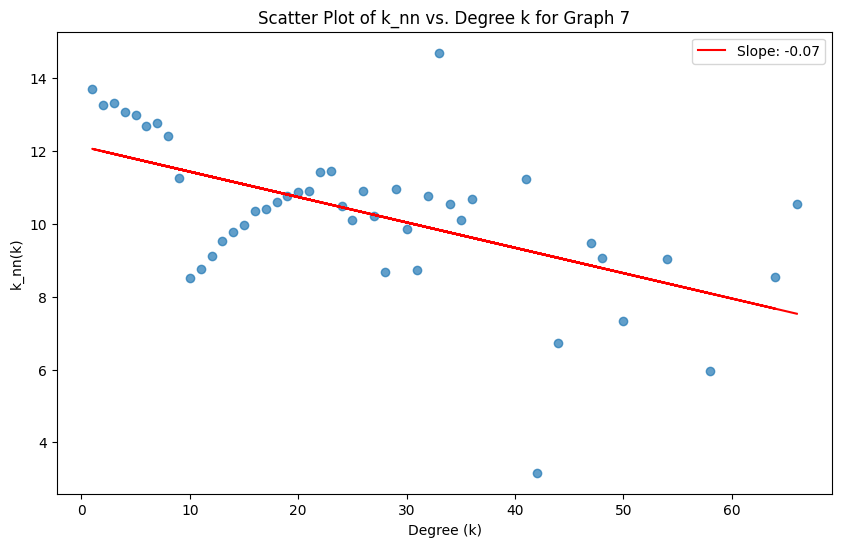

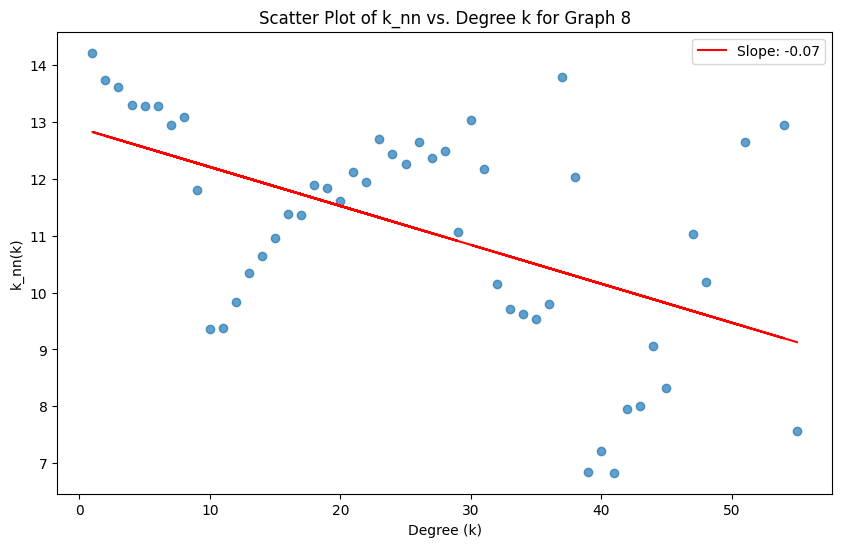

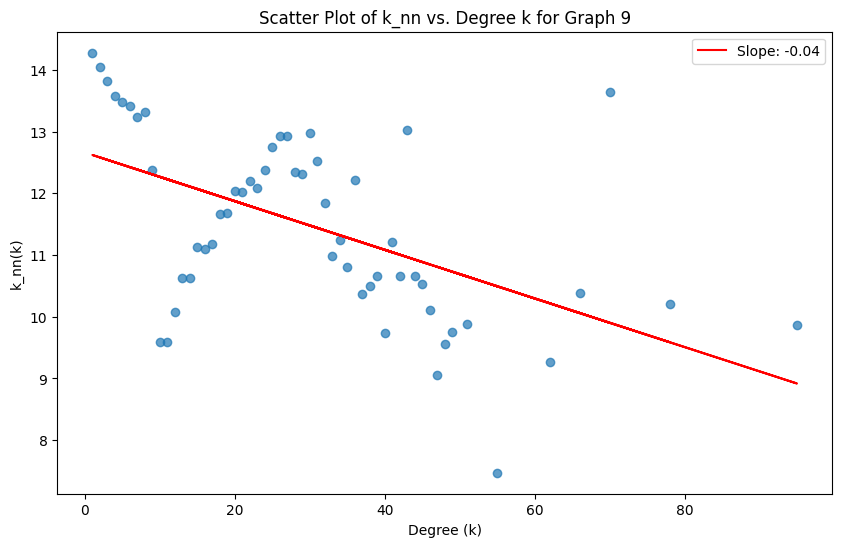

In [ ]:

def k_nn(G):
    k_nn_dict = defaultdict(list)
    for node in G.nodes():
        neighbors = G.neighbors(node)
        degree_neighbors = [G.degree(neighbor) for neighbor in neighbors]
        if len(degree_neighbors) > 0:
            k_nn = np.mean(degree_neighbors)
            k_nn_dict[G.degree(node)].append(k_nn)

    k_values = []
    k_nn_values = []
    for k, k_nn_list in k_nn_dict.items():
        k_values.append(k)
        k_nn_values.append(np.mean(k_nn_list))

    return k_values, k_nn_values

for i, G in enumerate(Gs):
    k_values, k_nn_values = k_nn(G)
    slope, intercept, r_value, p_value, std_err = linregress(k_values, k_nn_values)

    plt.figure(figsize=(10, 6))
    plt.scatter(k_values, k_nn_values, alpha=0.7)
    plt.plot(k_values, intercept + slope * np.array(k_values), 'r', label=f'Slope: {slope:.2f}')
    plt.xlabel('Degree (k)')
    plt.ylabel('k_nn(k)')
    plt.title(f'Scatter Plot of k_nn vs. Degree k for Graph {i + 1}')
    plt.legend()
    plt.show()

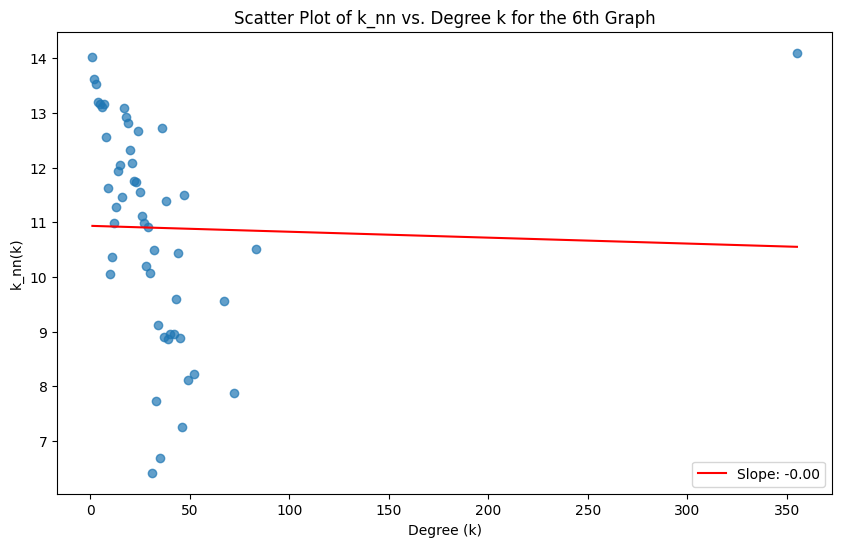

In [ ]:
# Using the code snipet from homework to validate previous implimentaiton :) Wasted too much time :(
import networkx as nx
import collections
import matplotlib.pyplot as plt
from scipy.stats import linregress

def knn(G):
    dic = nx.average_degree_connectivity(G)
    seq = sorted([d for n, d in G.degree()], reverse=True)
    count = collections.Counter(seq)
    knnVal = [dic[k] for k in count]
    return count, knnVal

# Select the 6th graph (index 5)
G_6 = Gs[5]

count, knnVal = knn(G_6)
k_values = list(count.keys())
slope, intercept, r_value, p_value, std_err = linregress(k_values, knnVal)

plt.figure(figsize=(10, 6))
plt.scatter(k_values, knnVal, alpha=0.7)
plt.plot(k_values, intercept + slope * np.array(k_values), 'r', label=f'Slope: {slope:.2f}')
plt.xlabel('Degree (k)')
plt.ylabel('k_nn(k)')
plt.title(f'Scatter Plot of k_nn vs. Degree k for the 6th Graph')
plt.legend()
plt.show()


## Giant component/mostly connected ?

In [ ]:
# calculate the percetage of nodes in largest component.
def largest_component_percentage(G):
    largest_component = max(nx.connected_components(G), key=len)
    return (len(largest_component) / len(G.nodes())) * 100

percentages_largest_component = [largest_component_percentage(G) for G in Gs]

print("Percentages of nodes in the largest connected component for each graph:")
for i, percentage in enumerate(percentages_largest_component):
    print(f"Graph {i}: {percentage:.2f}%")

Percentages of nodes in the largest connected component for each graph:
Graph 0: 100.00%
Graph 1: 99.95%
Graph 2: 100.00%
Graph 3: 99.97%
Graph 4: 99.88%
Graph 5: 99.92%
Graph 6: 99.89%
Graph 7: 99.90%
Graph 8: 99.96%


## Distribution of the first graph
The snap shot of the network on august 04, 2002.

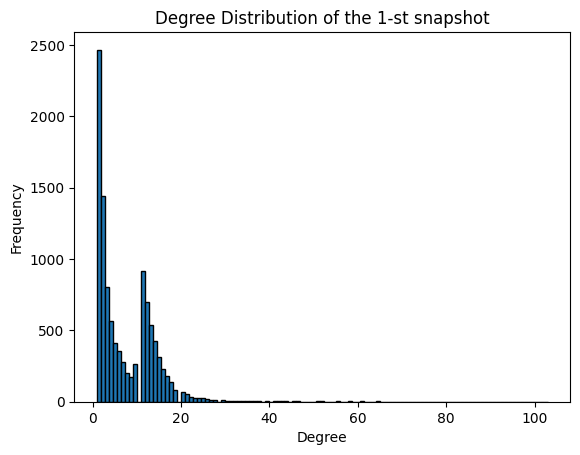

In [ ]:
# plot the first snapshot.
first_graph = Gs[0]
degrees = [degree for node, degree in first_graph.degree()]

plt.hist(degrees, bins='auto', edgecolor='black')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the 1-st snapshot')
plt.show()

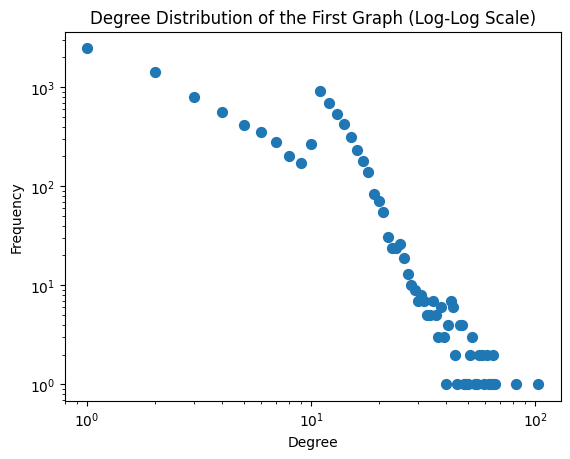

In [ ]:
first_graph = Gs[0]
degrees = [degree for node, degree in first_graph.degree()]
degree_counts = Counter(degrees)
unique_degrees, frequencies = zip(*degree_counts.items())

plt.scatter(unique_degrees, frequencies, marker='o', s=50)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the First Graph (Log-Log Scale)')
plt.show()

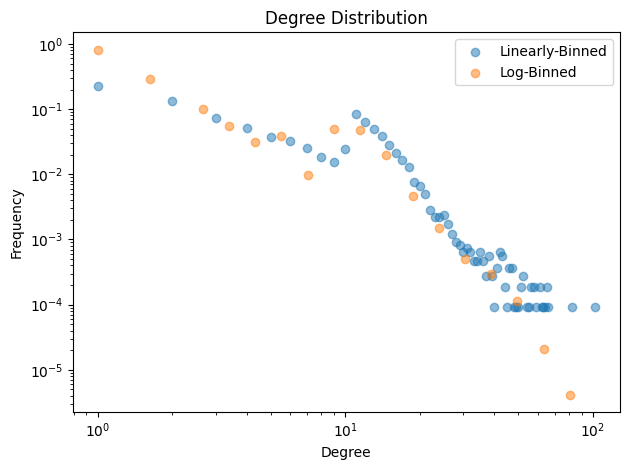

In [ ]:
G = Gs[0]
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
degree_count = collections.Counter(degree_sequence)
deg, cnt = zip(*degree_count.items())

linear_bins = np.arange(min(deg), max(deg) + 1, 1)

log_bins = np.logspace(np.log10(min(deg)), np.log10(max(deg)), num=20)

linear_hist, _ = np.histogram(degree_sequence, bins=linear_bins, density=True)

log_hist, _ = np.histogram(degree_sequence, bins=log_bins, density=True)

plt.scatter(linear_bins[:-1], linear_hist, label="Linearly-Binned", alpha=0.5)
plt.scatter(log_bins[:-1], log_hist, label="Log-Binned", alpha=0.5)
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.xscale("log")
plt.yscale("log")
plt.title("Degree Distribution")
plt.legend()
plt.tight_layout()
plt.show()

## Distribution of the graphs combined

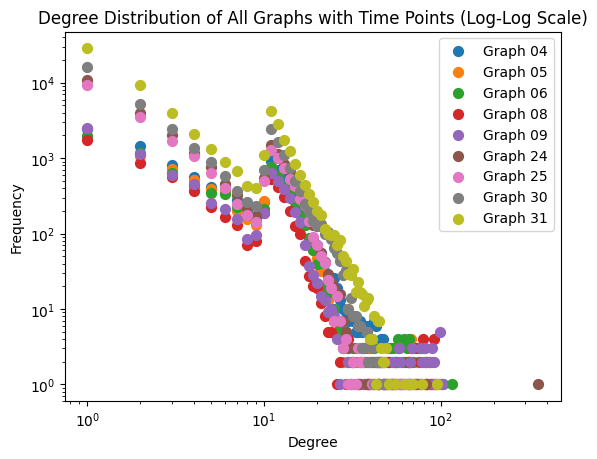

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']

# calculate and plot the degree distribution
def plot_degree_distribution(graph, label=None):
    degrees = [degree for node, degree in graph.degree()]
    degree_counts = Counter(degrees)
    unique_degrees, frequencies = zip(*degree_counts.items())
    plt.scatter(unique_degrees, frequencies, marker='o', s=50, label=label)

for graph, time_point in zip(Gs, time_points):
    plot_degree_distribution(graph, label=f"Graph {time_point}")

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of All Graphs with Time Points (Log-Log Scale)')

if len(Gs) > 1:
    plt.legend()

plt.show()

Why is all graphs following this pattern of distribution?
Savvy users believe that more connections means better query results thus they would connect as many hosts as possible.
It was a pure power-law distribution in Nov, 2000 `shown in paper`. Then it transitioned into a multi-modal distribution as less and less users with lower connectivity and majority of hosts builds lots of connection for better results.

## Hubs

### $γ$ calculation

In [ ]:
def estimate_gamma(G):
    degrees = [degree for _, degree in G.degree()]
    k_min = np.min(degrees)
    n = len(degrees)
    gamma = 1 + n / np.sum(np.log(degrees / k_min))
    return gamma

degree_exponents = [estimate_gamma(G) for G in Gs]

for i, gamma in enumerate(degree_exponents):
    print(f"Degree Exponent (gamma) for graph {i}: {gamma}")

Degree Exponent (gamma) for graph 0: 1.6680029056518901
Degree Exponent (gamma) for graph 1: 1.6735141554045259
Degree Exponent (gamma) for graph 2: 1.673374365050985
Degree Exponent (gamma) for graph 3: 1.753738545725112
Degree Exponent (gamma) for graph 4: 1.7799648809789819
Degree Exponent (gamma) for graph 5: 1.9859177692770147
Degree Exponent (gamma) for graph 6: 1.9939394546240772
Degree Exponent (gamma) for graph 7: 2.0356848489649373
Degree Exponent (gamma) for graph 8: 2.062935369729094


### k_max and $γ$

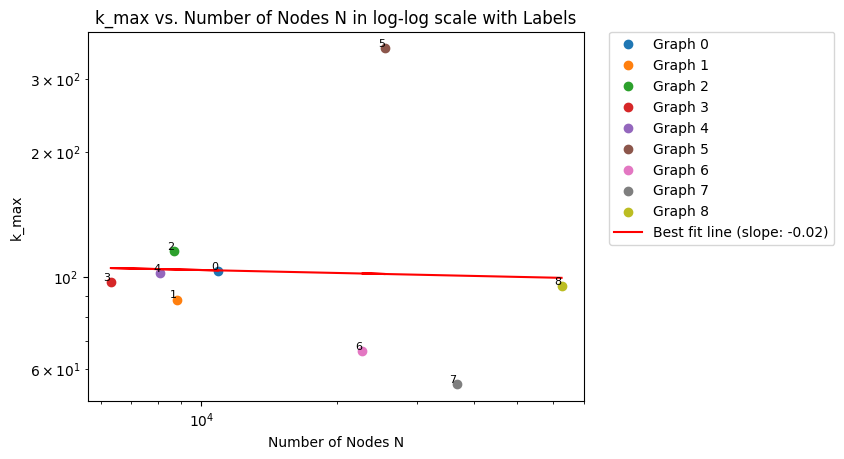

In [ ]:
graph_stats = [
    (10876, 39994),
    (8846, 31839),
    (8717, 31525),
    (6301, 20777),
    (8114, 26013),
    (25518, 65369),
    (22687, 54705),
    (36682, 88328),
    (62586, 147892),
]

# k_max for each graph
k_max_values = [max(dict(G.degree()).values()) for G in Gs]

# the number of nodes for each graph
num_nodes = [stats[0] for stats in graph_stats]

#k_max vs. the number of nodes - log-log space
for i, (x, y) in enumerate(zip(num_nodes, k_max_values)):
    plt.scatter(x, y, label=f"Graph {i}")
    plt.text(x, y, f"{i}", fontsize=8, ha='right', va='bottom')

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Nodes N")
plt.ylabel("k_max")

# line of best fit
log_num_nodes = np.log10(num_nodes)
log_k_max_values = np.log10(k_max_values)
coeffs = np.polyfit(log_num_nodes, log_k_max_values, 1)
poly = np.poly1d(coeffs)
log_best_fit = poly(log_num_nodes)
best_fit = 10**log_best_fit

# Plot the line of best fit
plt.plot(num_nodes, best_fit, color="red", label=f"Best fit line (slope: {coeffs[0]:.2f})")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.title("k_max vs. Number of Nodes N in log-log scale with Labels")
plt.show()

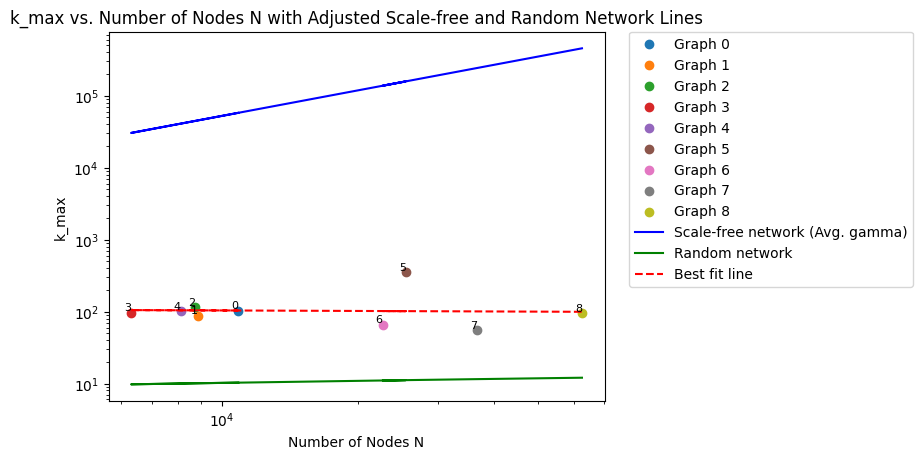

In [ ]:
graph_stats = [
    (10876, 39994),
    (8846, 31839),
    (8717, 31525),
    (6301, 20777),
    (8114, 26013),
    (25518, 65369),
    (22687, 54705),
    (36682, 88328),
    (62586, 147892),
]

k_max_values = [max(dict(G.degree()).values()) for G in Gs]

num_nodes = [stats[0] for stats in graph_stats]

gammas = [1.668, 1.674, 1.673, 1.754, 1.780, 1.986, 1.994, 2.036, 2.063]

# k_max vs. the number of nodes, log-log space
for i, (x, y) in enumerate(zip(num_nodes, k_max_values)):
    plt.scatter(x, y, label=f"Graph {i}")
    plt.text(x, y, f"{i}", fontsize=8, ha='right', va='bottom')

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Nodes N")
plt.ylabel("k_max")

average_gamma = np.mean(gammas)

k_min_values = [min(dict(G.degree()).values()) for G in Gs]

# the lines for scale-free and random networks
sf_line = [k_min * n**(1 / (average_gamma - 1)) for k_min, n in zip(k_min_values, num_nodes)]
random_line = [k_min + np.log(n) for k_min, n in zip(k_min_values, num_nodes)]

# plot
plt.plot(num_nodes, sf_line, color="blue", label="Scale-free network (Avg. gamma)")
plt.plot(num_nodes, random_line, color="green", label="Random network")
slope, intercept = np.polyfit(np.log(num_nodes), np.log(k_max_values), 1)
best_fit_line = [np.exp(slope * np.log(n) + intercept) for n in num_nodes]
plt.plot(num_nodes, best_fit_line, color="red", linestyle="--", label="Best fit line")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.title("k_max vs. Number of Nodes N with Adjusted Scale-free and Random Network Lines")
plt.show()


From textbook section 4.3(*networksciencebook.com*):
> In summary the key difference between a random and a scale-free network is rooted in the different shape of the Poisson and of the power-law function: In a random network most nodes have comparable degrees and hence hubs are forbidden. Hubs are not only tolerated, but are expected in scale-free networks (Image 4.6). Furthermore, the more nodes a scalefree network has, the larger are its hubs. Indeed, the size of the hubs grows polynomially with network size, hence they can grow quite large in scalefree networks. In contrast in a random network the size of the largest node grows logarithmically or slower with N, implying that hubs will be tiny even in a very large random network.


For scale free networks, we have:
$$
k_{max} \sim N^{1\over γ - 1}
$$
For random networks, we have the relationship:
$$
k_{max} \sim ln(N)
$$


In [ ]:
def degree_distribution(G):
    degree_dict = dict(G.degree())
    degree_counts = {}

    for _, degree in degree_dict.items():
        if degree in degree_counts:
            degree_counts[degree] += 1
        else:
            degree_counts[degree] = 1

    degree_counts = {k: v / len(G) for k, v in degree_counts.items()}

    return degree_counts

second_moment_degrees = []

for G in Gs:
    degree_dist = degree_distribution(G)
    second_moment = sum(k ** 2 * Pk for k, Pk in degree_dist.items())
    second_moment_degrees.append(second_moment)

for i, second_moment_degree in enumerate(second_moment_degrees):
    print(f"Second moment average degree for graph {i}: {second_moment_degree:.2f}")


Second moment average degree for graph 0: 102.74
Second moment average degree for graph 1: 106.47
Second moment average degree for graph 2: 104.19
Second moment average degree for graph 3: 116.43
Second moment average degree for graph 4: 107.80
Second moment average degree for graph 5: 59.32
Second moment average degree for graph 6: 51.82
Second moment average degree for graph 7: 55.18
Second moment average degree for graph 8: 54.84


### Hubs visualisation

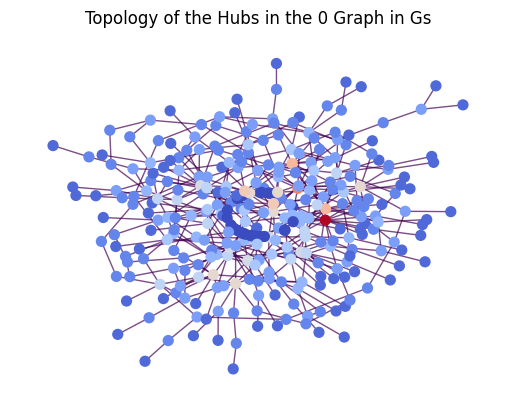

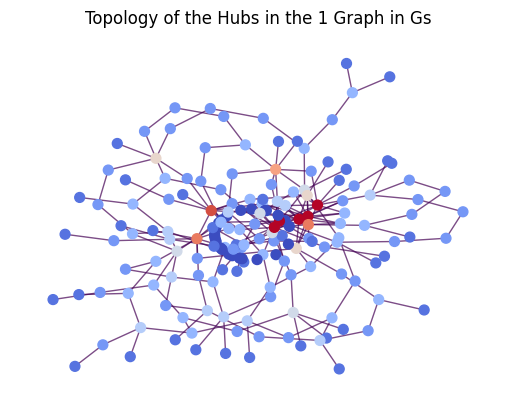

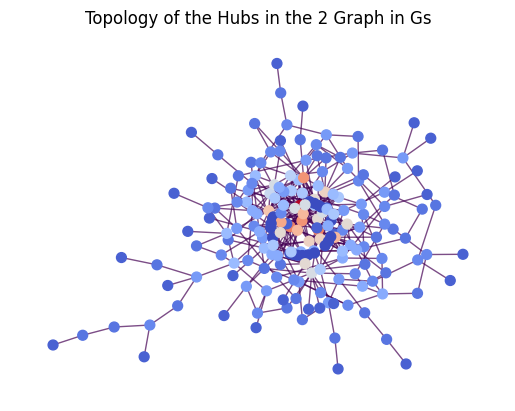

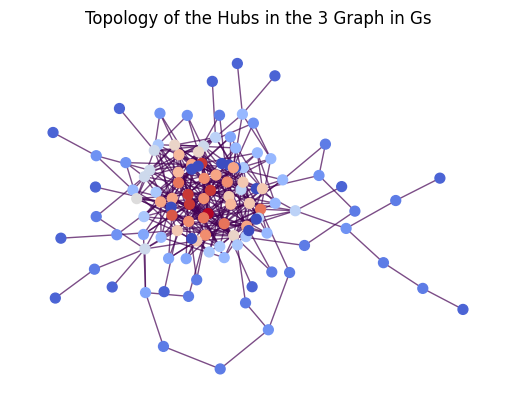

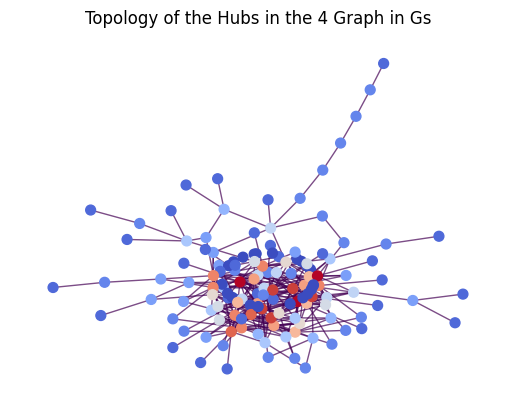

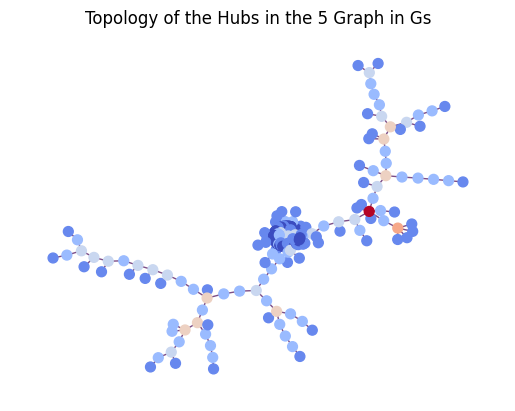

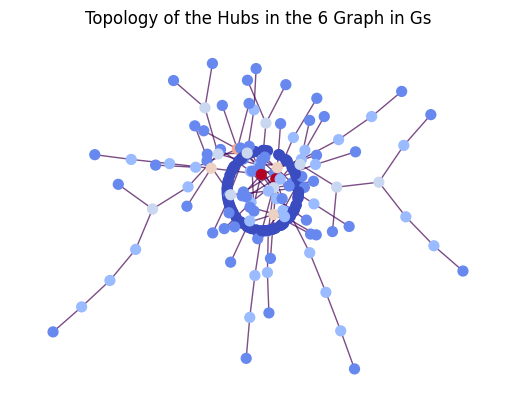

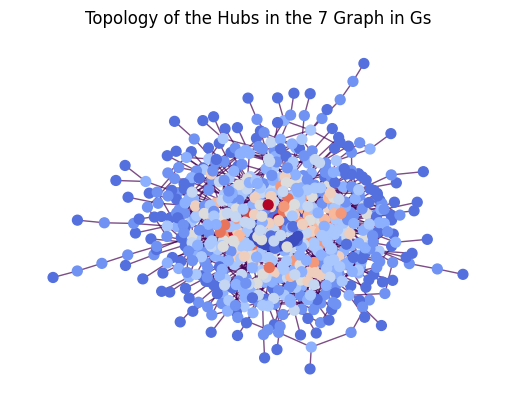

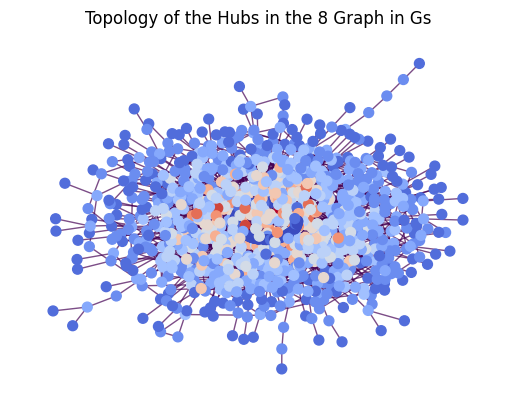

In [ ]:

for i, G in enumerate(Gs):
  degree_threshold = 20

  node_degrees = dict(G.degree())
  hubs = {node for node, degree in node_degrees.items() if degree > degree_threshold}
  hub_subgraph = G.subgraph(hubs)
  pos = nx.kamada_kawai_layout(hub_subgraph)

  node_colors = [degree for _, degree in hub_subgraph.degree()]
  norm = plt.Normalize(vmin=min(node_colors), vmax=max(node_colors))
  cmap = plt.cm.coolwarm
  node_colors = cmap(norm(node_colors))
  nx.draw_networkx_nodes(hub_subgraph, pos, node_size=50, node_color=node_colors)

  edge_colors = [hub_subgraph[u][v].get('weight', 1) for u, v in hub_subgraph.edges()]
  norm = plt.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))
  cmap = plt.cm.viridis
  edge_colors = cmap(norm(edge_colors))
  nx.draw_networkx_edges(hub_subgraph, pos, edge_color=edge_colors, alpha=0.7)

  plt.title("Topology of the Hubs in the {} Graph in Gs".format(i))
  plt.axis('off')
  plt.show()

**Threshold 30**

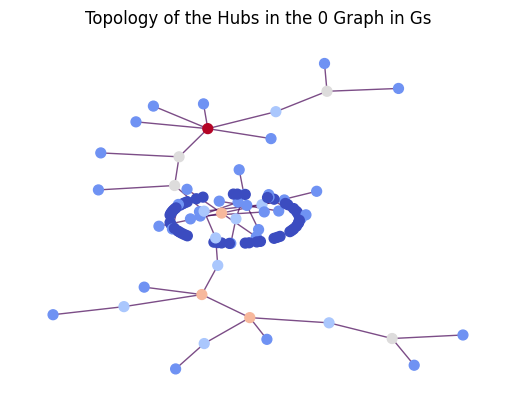

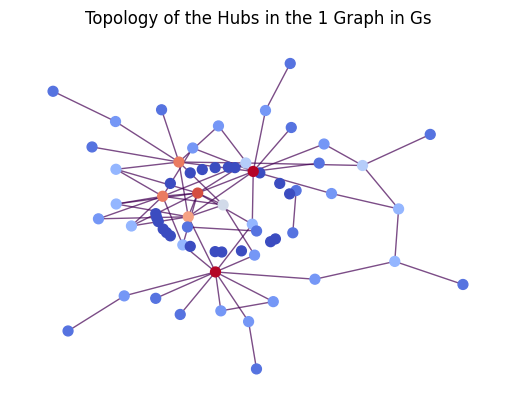

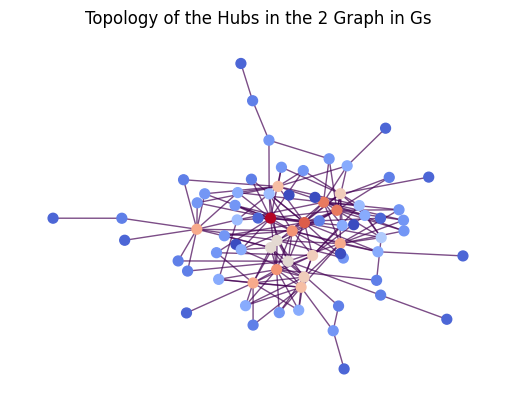

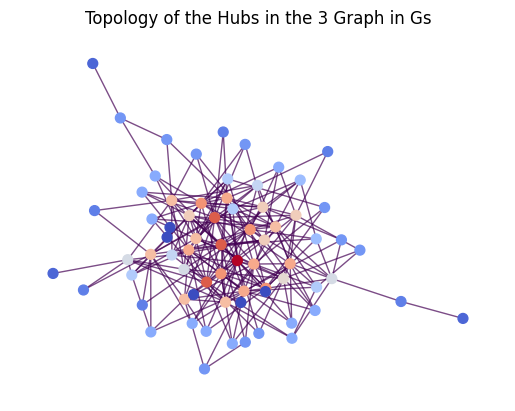

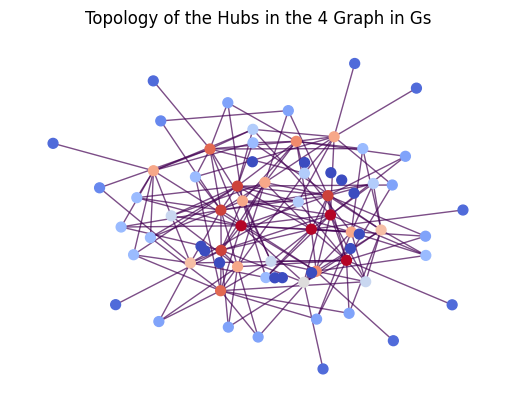

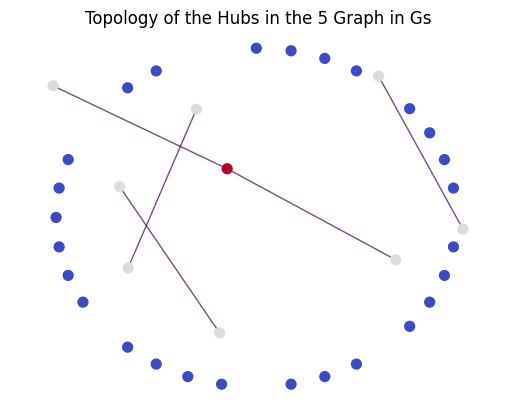

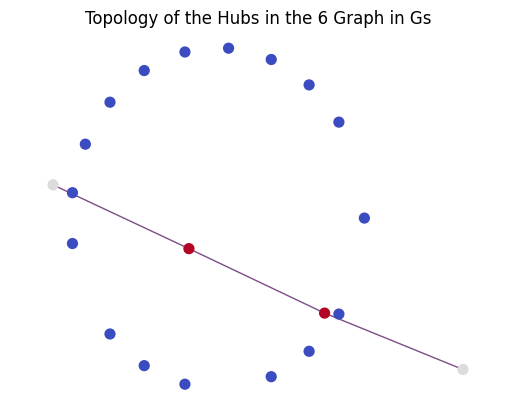

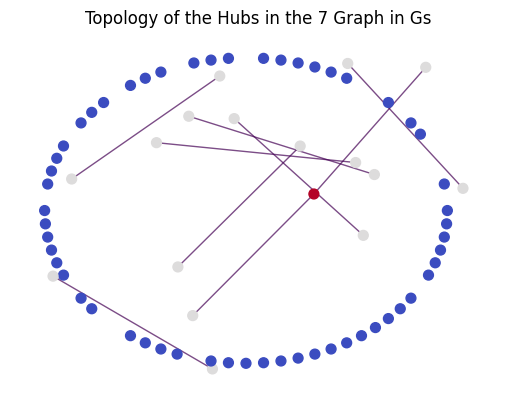

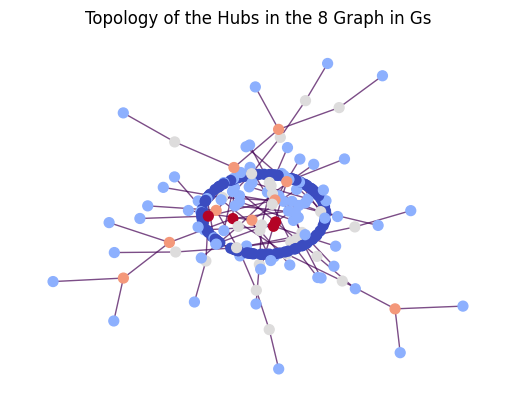

In [ ]:

for i, G in enumerate(Gs):
  degree_threshold = 30
  node_degrees = dict(G.degree())
  hubs = {node for node, degree in node_degrees.items() if degree > degree_threshold}
  hub_subgraph = G.subgraph(hubs)
  pos = nx.kamada_kawai_layout(hub_subgraph)

  node_colors = [degree for _, degree in hub_subgraph.degree()]
  norm = plt.Normalize(vmin=min(node_colors), vmax=max(node_colors))
  cmap = plt.cm.coolwarm
  node_colors = cmap(norm(node_colors))
  nx.draw_networkx_nodes(hub_subgraph, pos, node_size=50, node_color=node_colors)

  edge_colors = [hub_subgraph[u][v].get('weight', 1) for u, v in hub_subgraph.edges()]
  norm = plt.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))
  cmap = plt.cm.viridis
  edge_colors = cmap(norm(edge_colors))
  nx.draw_networkx_edges(hub_subgraph, pos, edge_color=edge_colors, alpha=0.7)

  plt.title("Topology of the Hubs in the {} Graph in Gs".format(i))

  plt.axis('off')

  plt.show()

**Threshol 20**

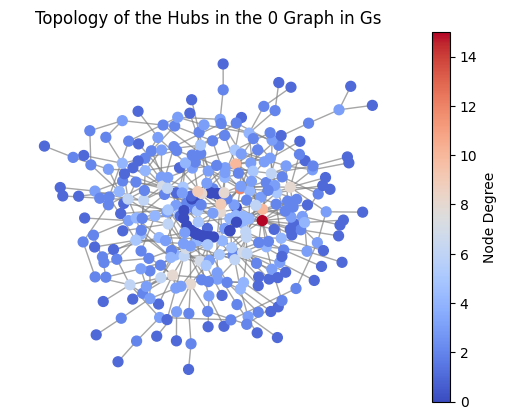

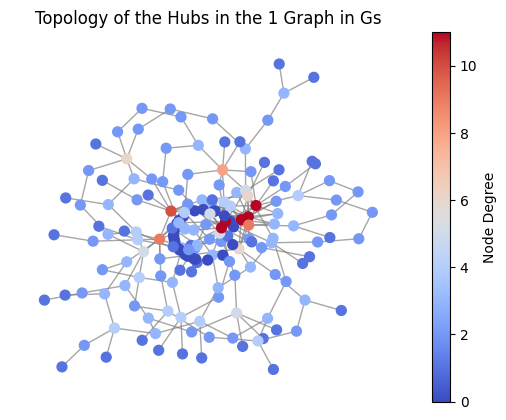

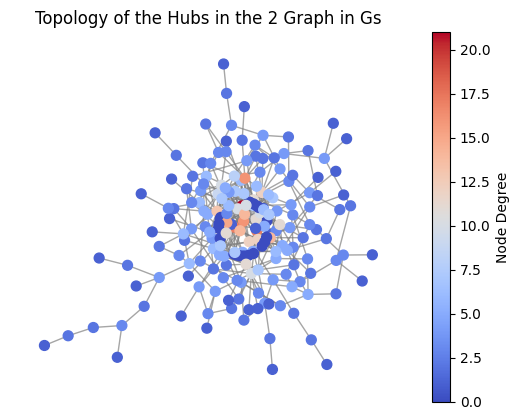

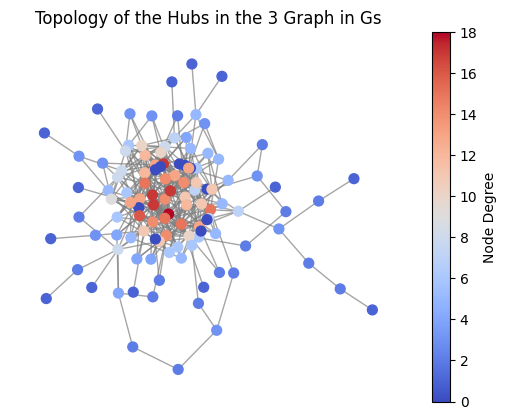

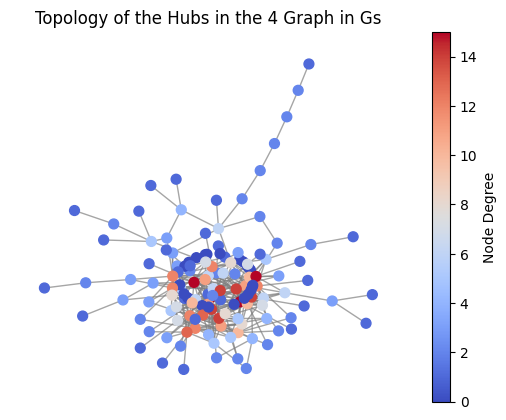

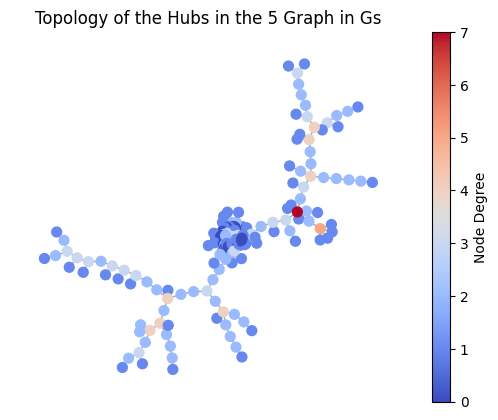

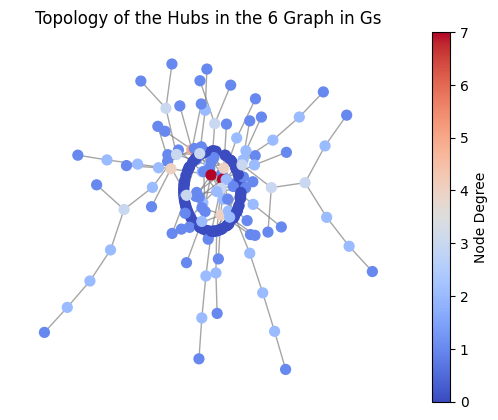

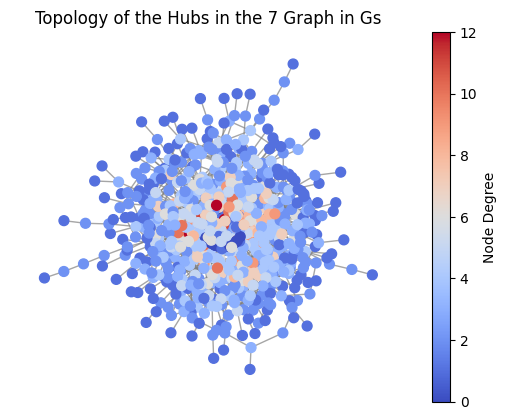

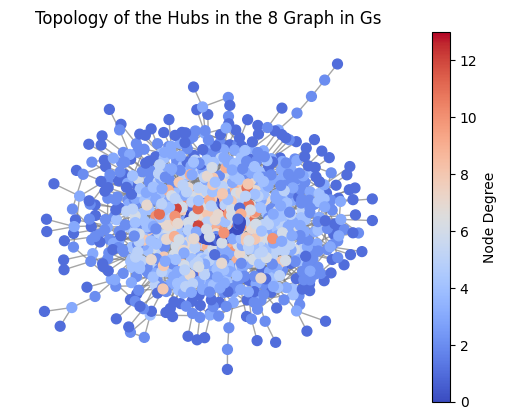

In [ ]:
import matplotlib as mpl

for i, G in enumerate(Gs):
    fig, ax = plt.subplots()

    degree_threshold = 20
    node_degrees = dict(G.degree())
    hubs = {node for node, degree in node_degrees.items() if degree > degree_threshold}
    hub_subgraph = G.subgraph(hubs)

    pos = nx.kamada_kawai_layout(hub_subgraph)

    node_colors = [degree for _, degree in hub_subgraph.degree()]
    norm = mpl.colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
    cmap = plt.cm.coolwarm
    node_colors = cmap(norm(node_colors))
    nx.draw_networkx_nodes(hub_subgraph, pos, node_size=50, node_color=node_colors, ax=ax)

    nx.draw_networkx_edges(hub_subgraph, pos, edge_color='gray', alpha=0.7, ax=ax)
    ax.set_title("Topology of the Hubs in the {} Graph in Gs".format(i))
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label='Node Degree')
    ax.axis('off')
    plt.show()


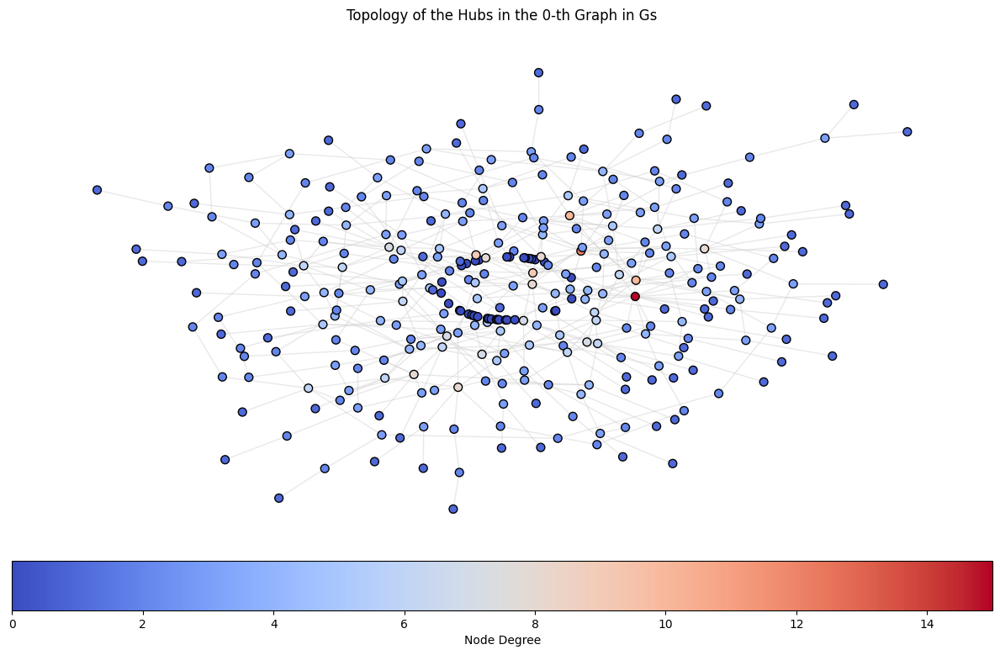

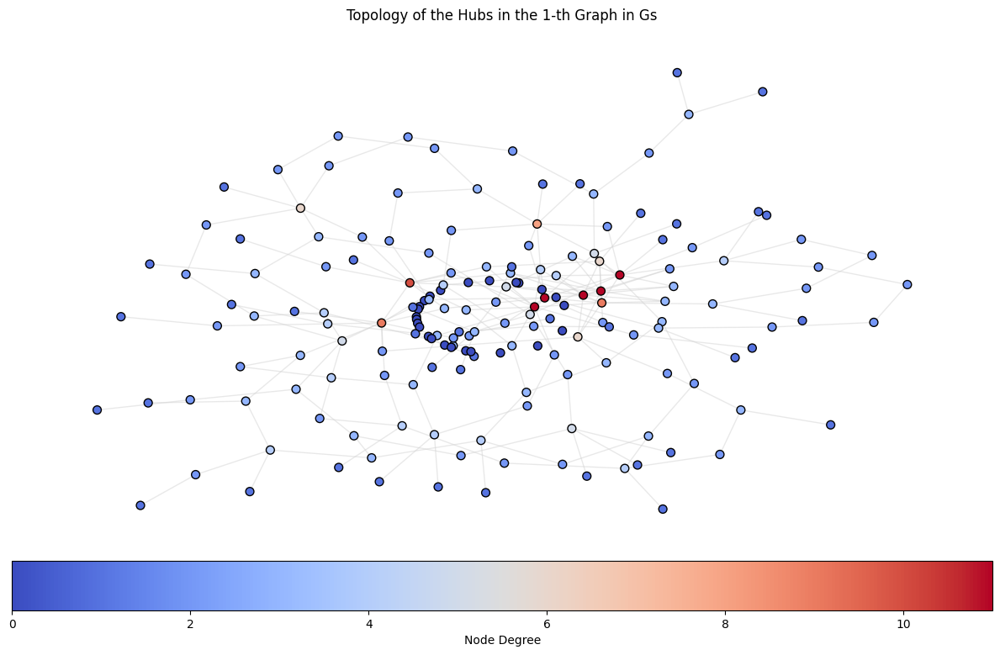

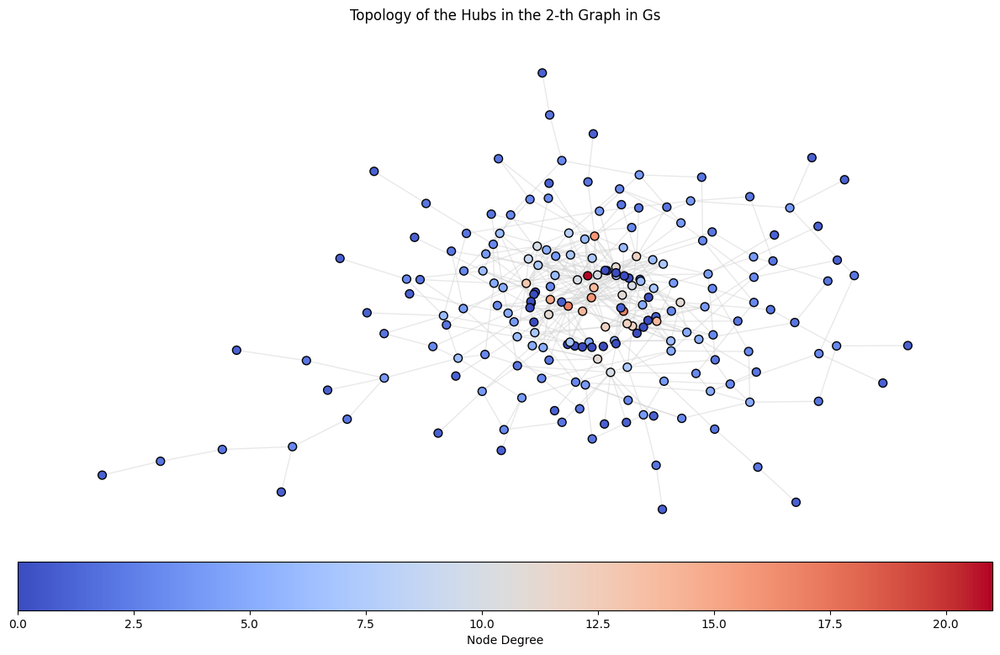

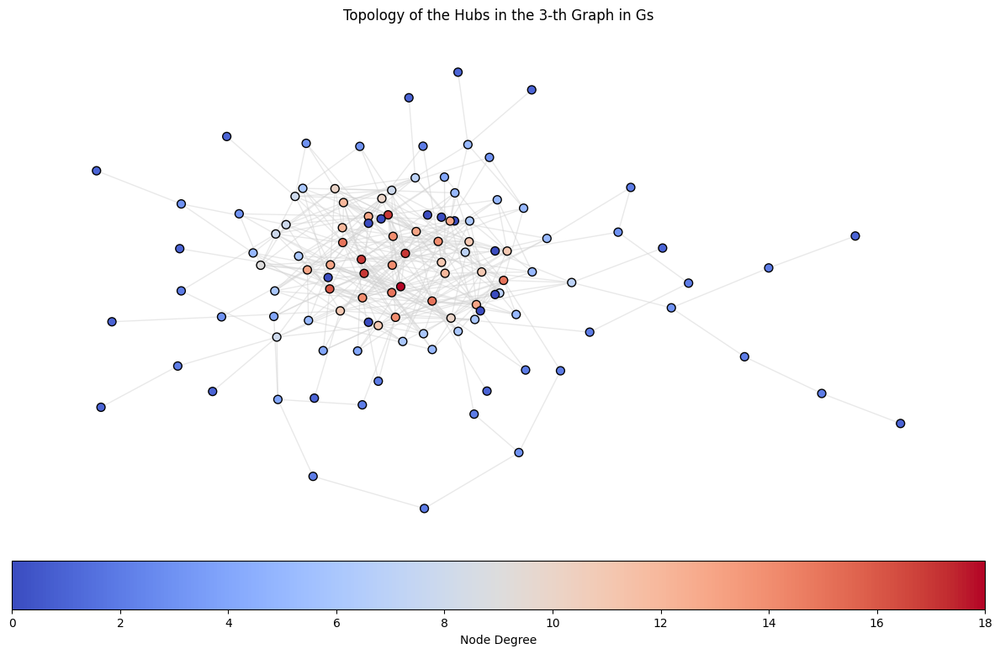

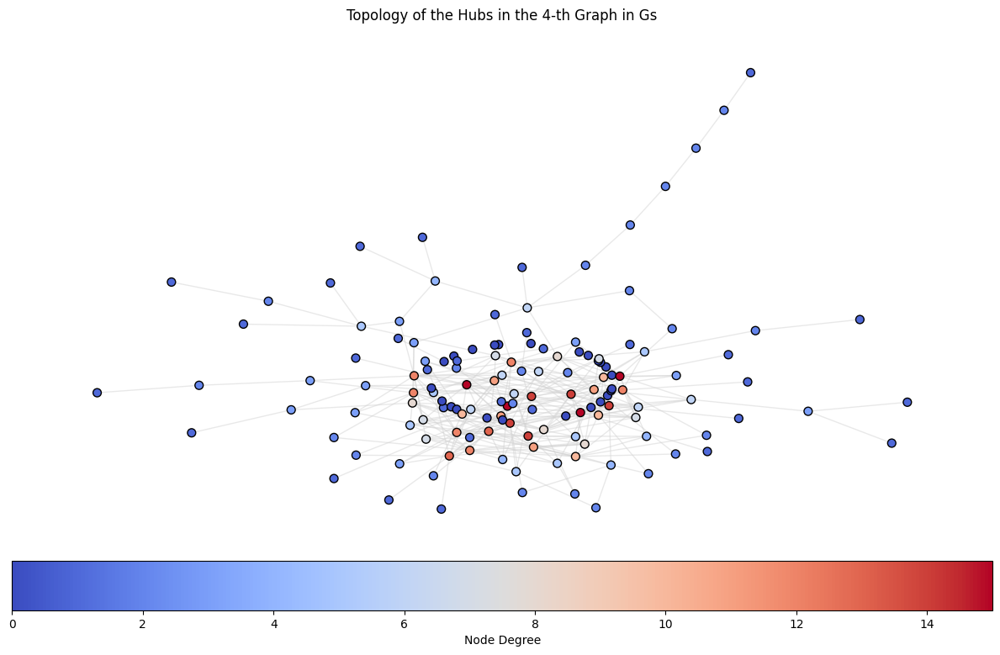

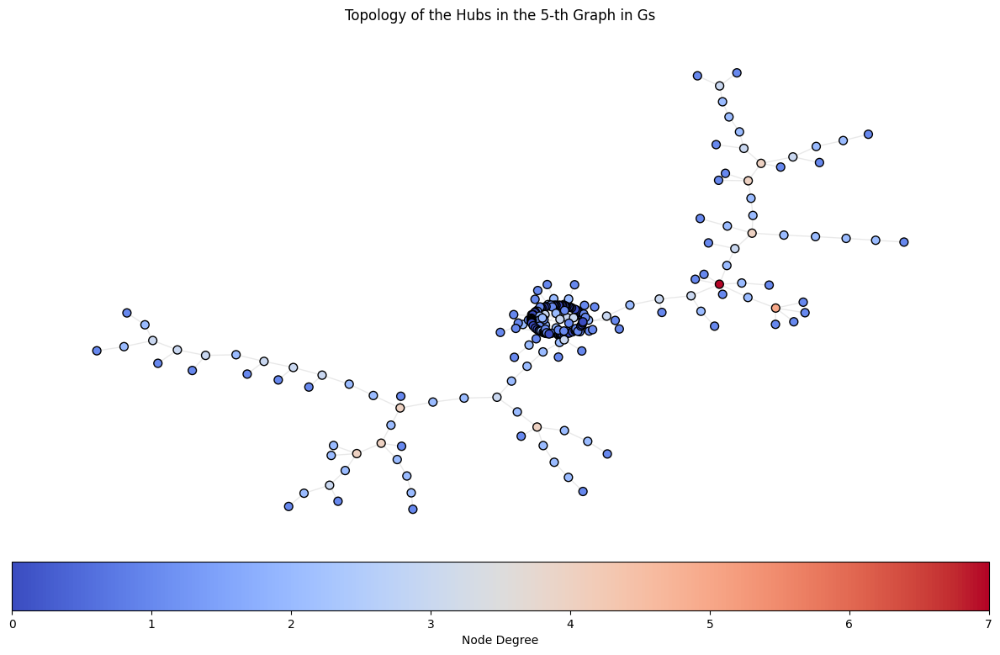

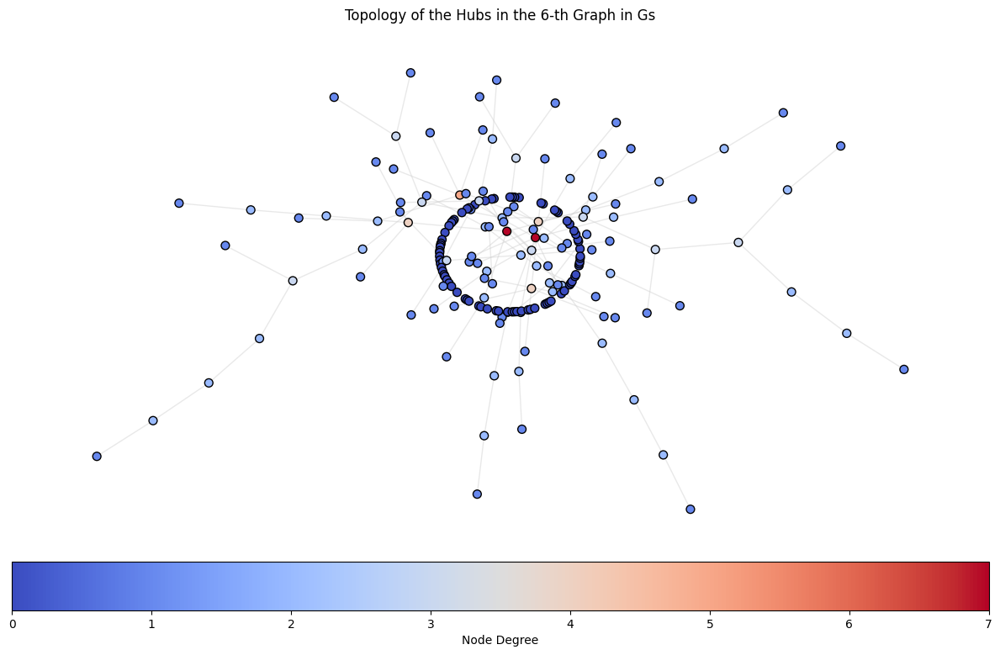

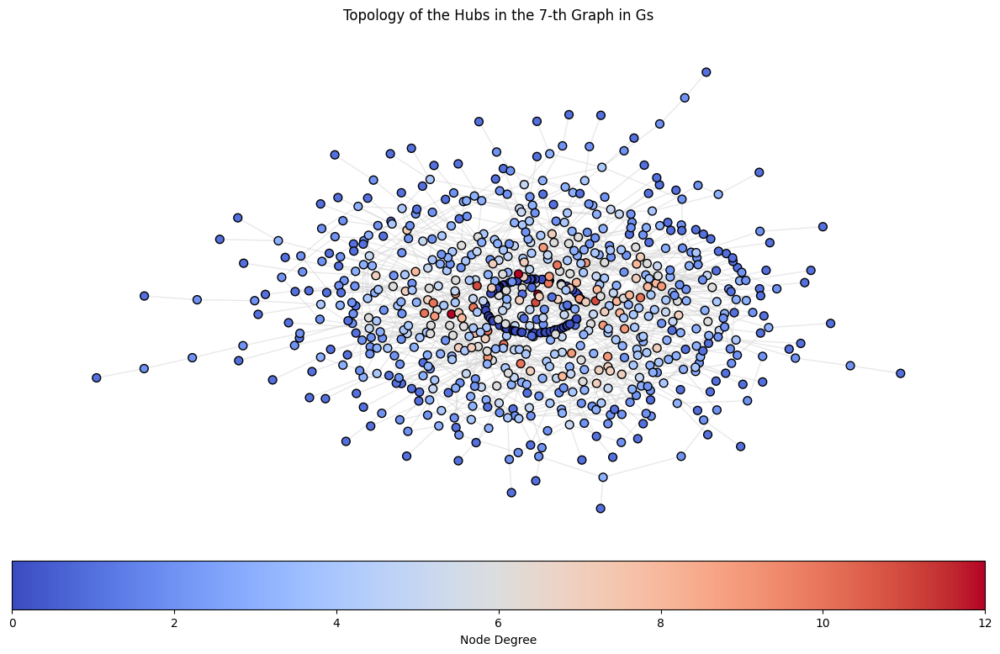

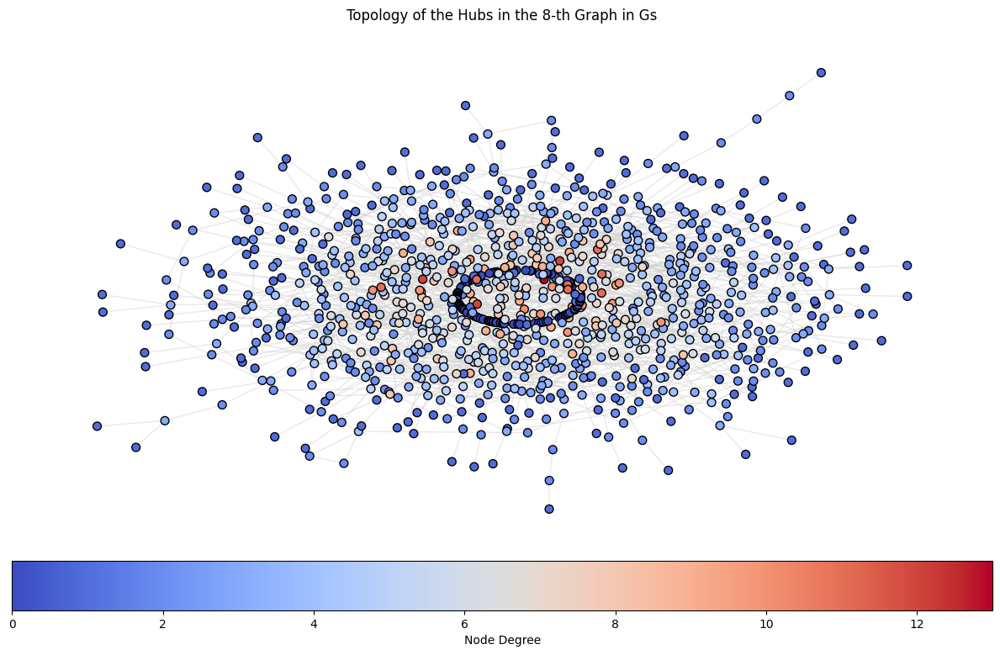

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib as mpl

for i, G in enumerate(Gs):
    fig, ax = plt.subplots(figsize=(12, 8))  # Increased figure size for better visualization

    degree_threshold = 20
    node_degrees = dict(G.degree())
    hubs = {node for node, degree in node_degrees.items() if degree > degree_threshold}
    hub_subgraph = G.subgraph(hubs)

    # Kamada-Kawai layout tends to provide an aesthetically pleasing result for a wide variety of graphs.
    pos = nx.kamada_kawai_layout(hub_subgraph)

    # Define node colors based on their degree
    node_colors = [degree for _, degree in hub_subgraph.degree()]
    norm = mpl.colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
    cmap = plt.cm.coolwarm  # Cool to warm colormap
    node_colors = cmap(norm(node_colors))

    nx.draw_networkx_nodes(hub_subgraph, pos, node_size=50, node_color=node_colors, ax=ax, edgecolors='black')
    nx.draw_networkx_edges(hub_subgraph, pos, edge_color='lightgray', alpha=0.5, ax=ax)  # Increased transparency of edges

    ax.set_title(f"Topology of the Hubs in the {i}-th Graph in Gs")
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label='Node Degree', orientation='horizontal', pad=0.01)

    ax.axis('off')  # Turn off the axis
    plt.tight_layout()  # Makes sure the layout is neat
    plt.show()


<ipython-input-29-6bd7f9a5ed6c>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('coolwarm', len(Gs))


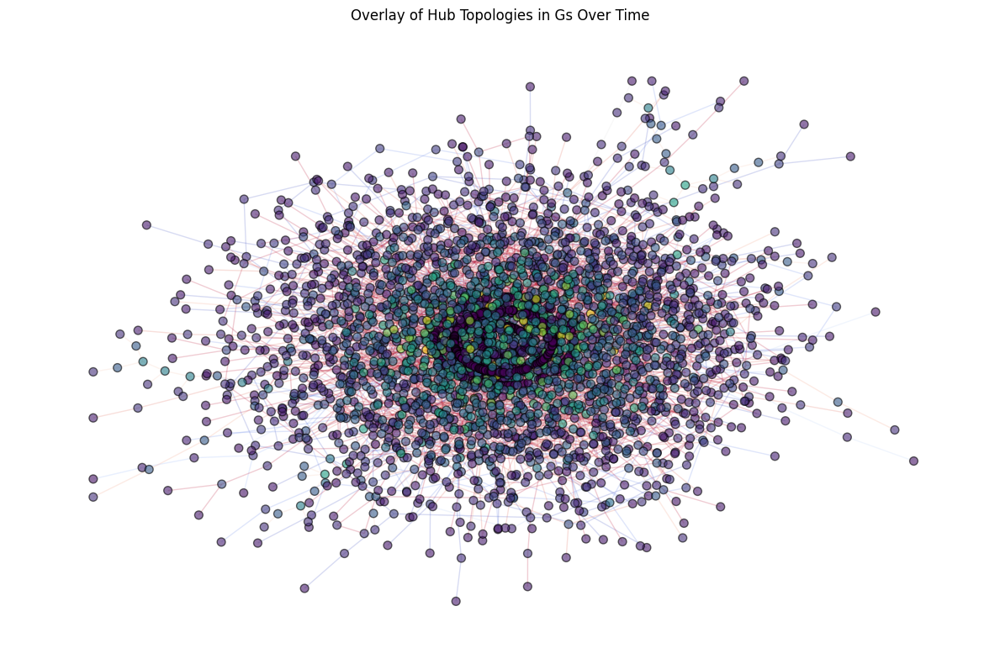

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib as mpl

fig, ax = plt.subplots(figsize=(12, 8))

# Choose a colormap that varies enough over the range to distinguish different times
color_map = plt.cm.get_cmap('coolwarm', len(Gs))

for idx, G in enumerate(Gs):
    degree_threshold = 20
    node_degrees = dict(G.degree())
    hubs = {node for node, degree in node_degrees.items() if degree > degree_threshold}
    hub_subgraph = G.subgraph(hubs)
    pos = nx.kamada_kawai_layout(hub_subgraph)

    node_colors = [degree for _, degree in hub_subgraph.degree()]
    norm = mpl.colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))

    # Use a different color for each time point
    time_color = color_map(idx)

    nx.draw_networkx_nodes(hub_subgraph, pos, node_size=50, node_color=node_colors, edgecolors='black', alpha=0.6, ax=ax)
    nx.draw_networkx_edges(hub_subgraph, pos, edge_color=time_color, alpha=0.2, ax=ax)  # Lighter edges for overlay

ax.set_title("Overlay of Hub Topologies in Gs Over Time")
ax.axis('off')
plt.tight_layout()
plt.show()


**Threshold 50**

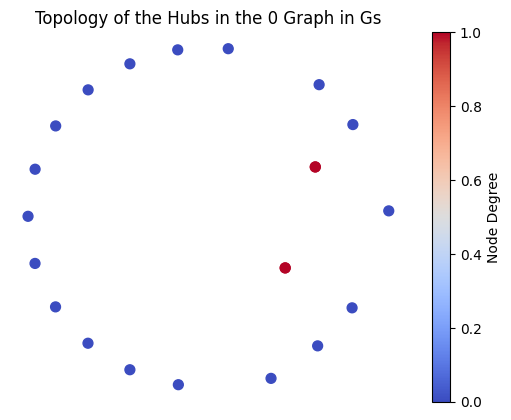

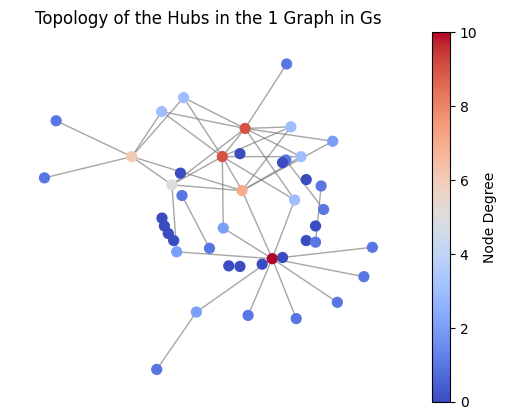

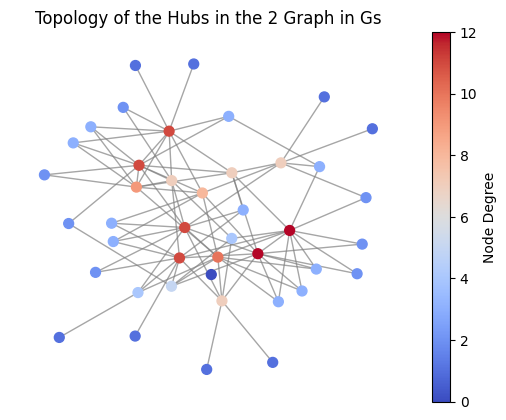

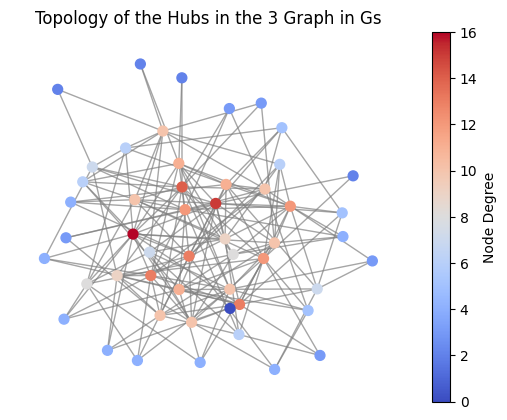

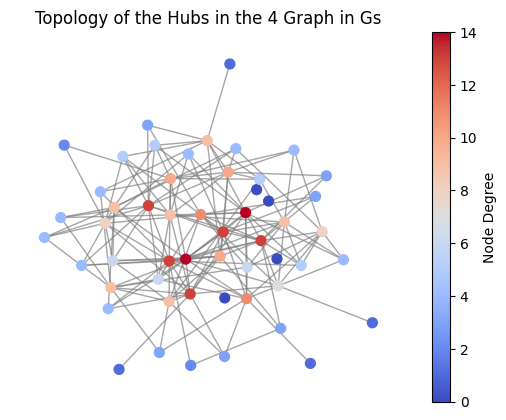

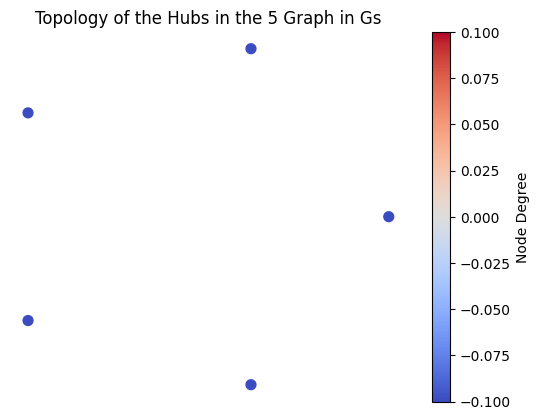

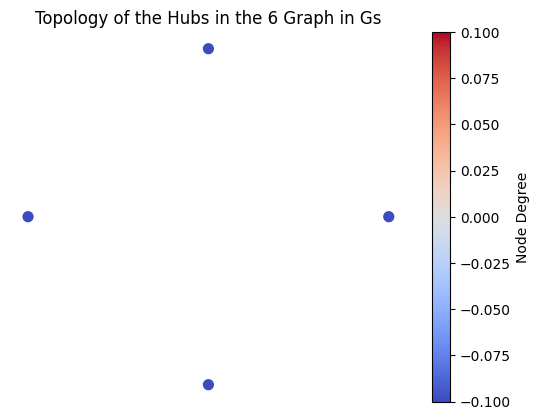

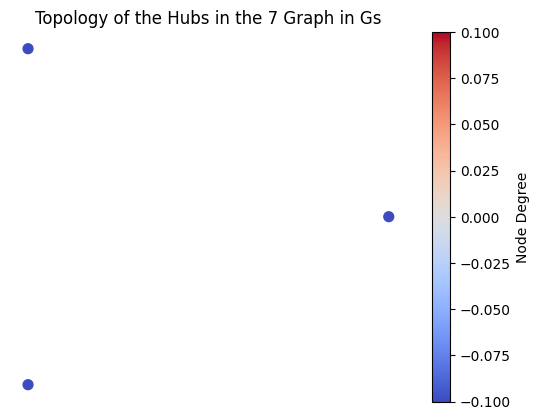

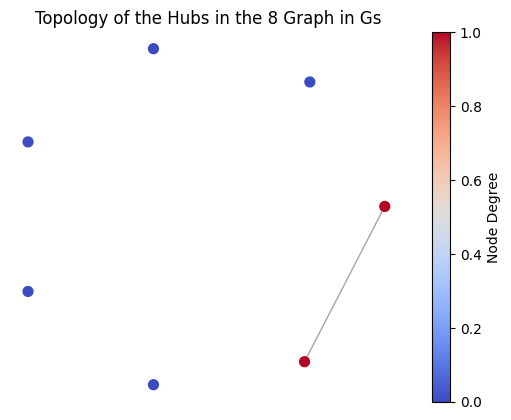

In [ ]:
import matplotlib as mpl

for i, G in enumerate(Gs):
    fig, ax = plt.subplots()

    degree_threshold = 50

    node_degrees = dict(G.degree())

    hubs = {node for node, degree in node_degrees.items() if degree > degree_threshold}

    hub_subgraph = G.subgraph(hubs)

    pos = nx.kamada_kawai_layout(hub_subgraph)

    node_colors = [degree for _, degree in hub_subgraph.degree()]
    norm = mpl.colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
    cmap = plt.cm.coolwarm
    node_colors = cmap(norm(node_colors))
    nx.draw_networkx_nodes(hub_subgraph, pos, node_size=50, node_color=node_colors, ax=ax)

    nx.draw_networkx_edges(hub_subgraph, pos, edge_color='gray', alpha=0.7, ax=ax)

    ax.set_title("Topology of the Hubs in the {} Graph in Gs".format(i))

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label='Node Degree')

    ax.axis('off')

    plt.show()


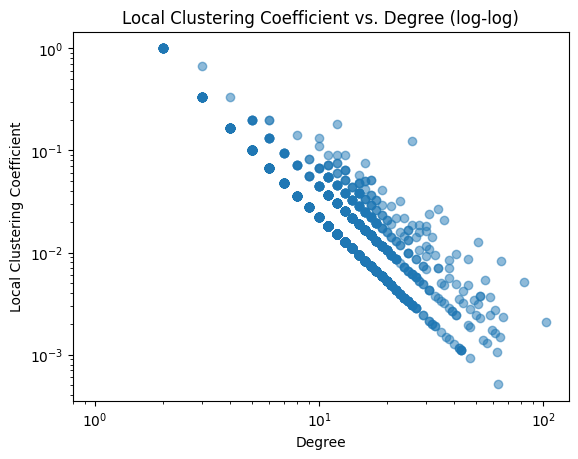

In [ ]:
G = Gs[0]

clustering_coeffs = nx.clustering(G)

degrees = dict(G.degree())

clustering_values = list(clustering_coeffs.values())
degree_values = list(degrees.values())

plt.scatter(degree_values, clustering_values, alpha=0.5)
plt.xscale('log')
plt.yscale('log')

plt.xlabel('Degree')
plt.ylabel('Local Clustering Coefficient')
plt.title('Local Clustering Coefficient vs. Degree (log-log)')

plt.show()

## Churn Rate

### What percentage of the nodes left the network each iteration?

In [ ]:
# the set of unique nodes the first graph.
initial_nodes = set(Gs[0].nodes())

# calculate the percentage of nodes that stayed and left.
def node_stay_leave_percentages(G, initial_nodes):
    current_nodes = set(G.nodes())
    common_nodes = initial_nodes.intersection(current_nodes)

    num_initial_nodes = len(initial_nodes)
    num_common_nodes = len(common_nodes)

    stayed_percentage = (num_common_nodes / num_initial_nodes) * 100
    left_percentage = 100 - stayed_percentage

    return stayed_percentage, left_percentage

#calculate the percentage of nodes that stayed and left for each graph
percentages = [node_stay_leave_percentages(G, initial_nodes) for G in Gs]

for i, (stayed, left) in enumerate(percentages):
    print(f"Graph {i}: {stayed:.2f}% nodes stayed, {left:.2f}% nodes left")


Graph 0: 100.00% nodes stayed, 0.00% nodes left
Graph 1: 81.34% nodes stayed, 18.66% nodes left
Graph 2: 80.15% nodes stayed, 19.85% nodes left
Graph 3: 57.93% nodes stayed, 42.07% nodes left
Graph 4: 74.60% nodes stayed, 25.40% nodes left
Graph 5: 100.00% nodes stayed, 0.00% nodes left
Graph 6: 100.00% nodes stayed, 0.00% nodes left
Graph 7: 100.00% nodes stayed, 0.00% nodes left
Graph 8: 100.00% nodes stayed, 0.00% nodes left


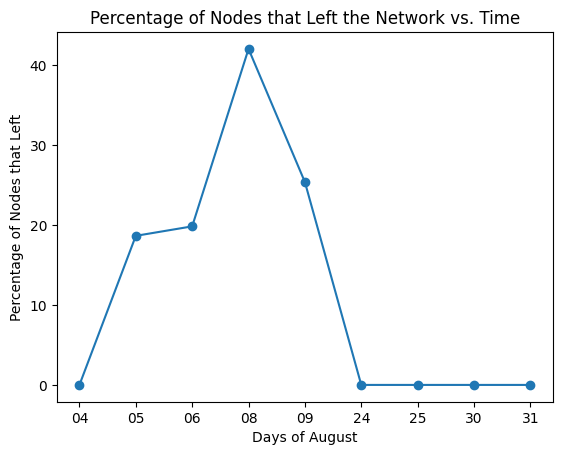

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']

initial_nodes = set(Gs[0].nodes())
# percentage of nodes that stayed and left
percentages = [node_stay_leave_percentages(G, initial_nodes) for G in Gs]
# percentage of nodes that left for each graph
left_percentages = [left for stayed, left in percentages]
# plot
plt.plot(time_points, left_percentages, marker='o')
plt.xlabel('Days of August')
plt.ylabel('Percentage of Nodes that Left')
plt.title('Percentage of Nodes that Left the Network vs. Time')
plt.show()

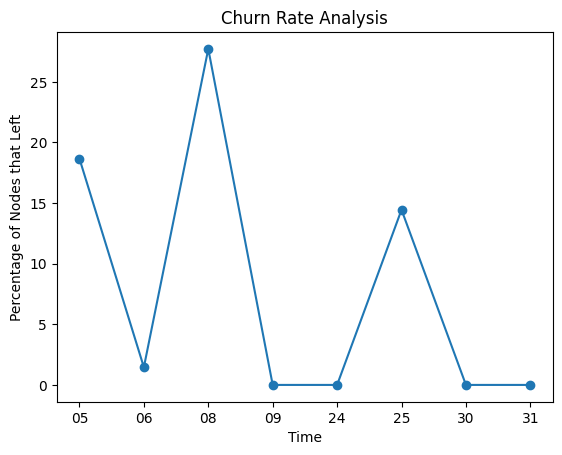

In [ ]:
percentages_left = []

for i in range(1, len(Gs)):
    nodes_previous = set(Gs[i-1].nodes())
    nodes_current = set(Gs[i].nodes())

    nodes_left = nodes_previous - nodes_current

    if len(nodes_previous) > 0:
        percentage_left = (len(nodes_left) / len(nodes_previous)) * 100
    else:
        percentage_left = 0

    percentages_left.append(percentage_left)

time_points = ['05', '06', '08', '09', '24', '25', '30', '31']
plt.plot(time_points, percentages_left, marker='o', linestyle='-')
plt.xlabel("Time")
plt.ylabel("Percentage of Nodes that Left")
plt.title("Churn Rate Analysis")
plt.show()

### What percentage of hosts left and came back to the network?

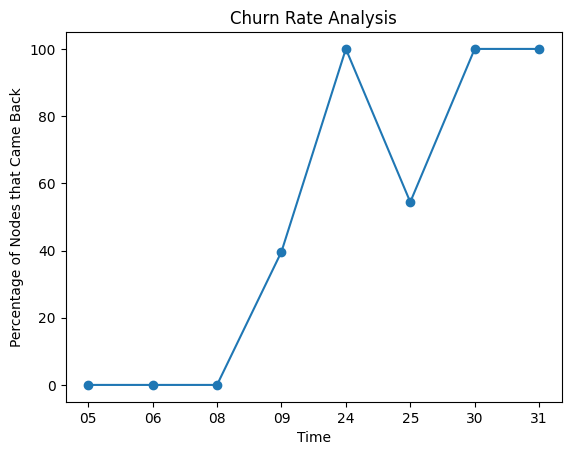

In [ ]:
all_nodes = set()
for G in Gs:
    all_nodes |= set(G.nodes())

percentages_came_back = []
nodes_left_history = set()

for i in range(1, len(Gs)):
    nodes_previous = set(Gs[i-1].nodes())
    nodes_current = set(Gs[i].nodes())

    nodes_left = nodes_previous - nodes_current
    nodes_left_history |= nodes_left

    nodes_came_back = nodes_left_history & nodes_current

    if len(nodes_left_history) > 0:
        percentage_came_back = (len(nodes_came_back) / len(nodes_left_history)) * 100
    else:
        percentage_came_back = 0

    percentages_came_back.append(percentage_came_back)

time_points = ['05', '06', '08', '09', '24', '25', '30', '31']

plt.plot(time_points, percentages_came_back, marker='o', linestyle='-')

plt.xlabel("Time")
plt.ylabel("Percentage of Nodes that Came Back")
plt.title("Churn Rate Analysis")

plt.show()

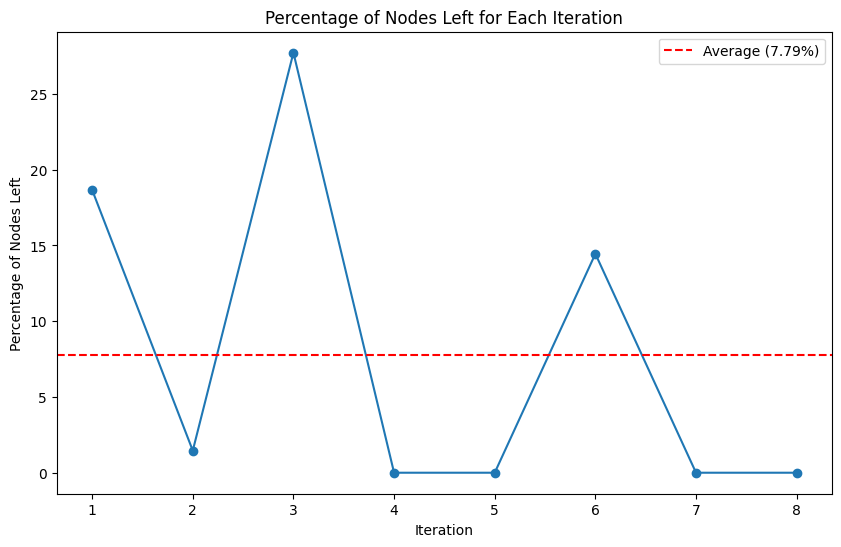

In [ ]:
iterations = list(range(1, len(Gs)))
percentage_nodes_left = []

for i in range(len(Gs) - 1):
    G1 = Gs[i]
    G2 = Gs[i + 1]

    nodes_left = len(set(G1.nodes()) - set(G2.nodes()))
    total_nodes = len(G1.nodes())
    percentage_left = (nodes_left / total_nodes) * 100
    percentage_nodes_left.append(percentage_left)
mean_percentage_left = np.mean(percentage_nodes_left)

plt.figure(figsize=(10, 6))
plt.plot(iterations, percentage_nodes_left, marker='o', linestyle='-')
plt.axhline(y=mean_percentage_left, color='r', linestyle='--', label=f'Average ({mean_percentage_left:.2f}%)')

plt.xlabel('Iteration')
plt.ylabel('Percentage of Nodes Left')
plt.title('Percentage of Nodes Left for Each Iteration')
plt.xticks(iterations)
plt.legend()
plt.show()

### New nodes joining the network vs. old nodes joining the network

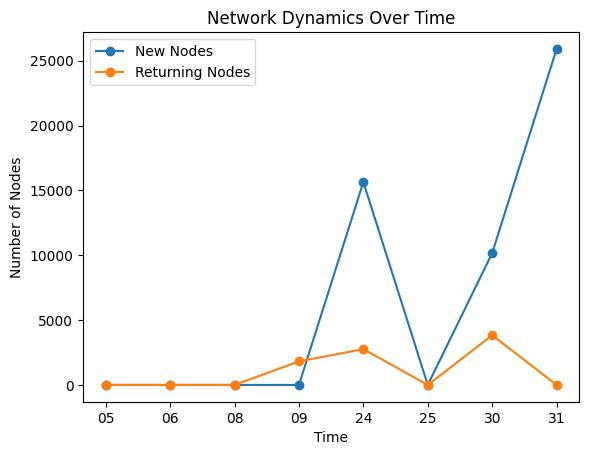

In [ ]:
all_nodes = set(Gs[0].nodes())
new_nodes_counts = []
returning_nodes_counts = []

for i in range(1, len(Gs)):
    nodes_previous = set(Gs[i-1].nodes())
    nodes_current = set(Gs[i].nodes())

    new_nodes = nodes_current - all_nodes
    returning_nodes = nodes_current & (all_nodes - nodes_previous)

    new_nodes_counts.append(len(new_nodes))
    returning_nodes_counts.append(len(returning_nodes))

    all_nodes |= nodes_current

time_points = ['05', '06', '08', '09', '24', '25', '30', '31']

plt.plot(time_points, new_nodes_counts, marker='o', linestyle='-', label="New Nodes")
plt.plot(time_points, returning_nodes_counts, marker='o', linestyle='-', label="Returning Nodes")

plt.xlabel("Time")
plt.ylabel("Number of Nodes")
plt.title("Network Dynamics Over Time")
plt.legend()

plt.show()

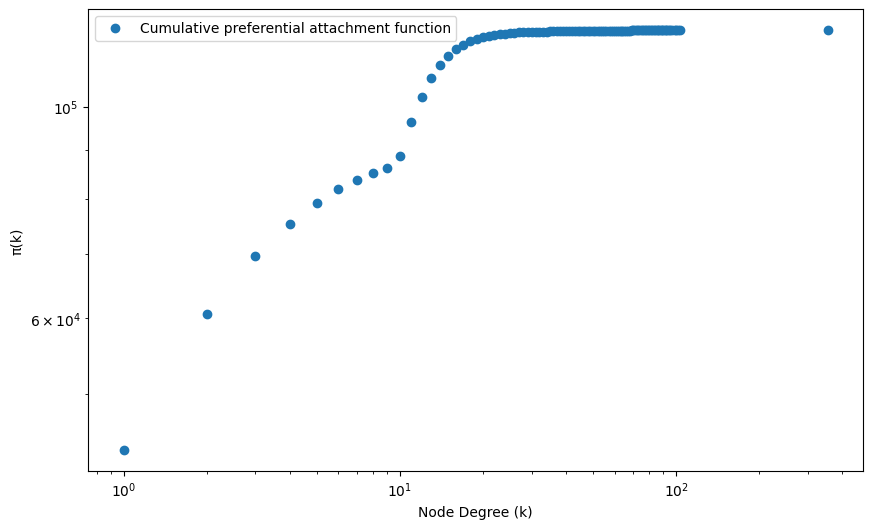

In [ ]:
time_points = ['04', '05', '06', '08', '09', '24', '25', '30', '31']
degree_changes = []

# calculate the degree change
for i in range(len(Gs) - 1):
    G1 = Gs[i]
    G2 = Gs[i + 1]

    for node in G1.nodes():
        if node in G2.nodes():
            degree_change = G2.degree(node) - G1.degree(node)
            degree_changes.append((G1.degree(node), degree_change))

degree_changes = np.array(degree_changes)
# calculate delta k / delta t assuming each time step is one day
degree_changes[:, 1] = degree_changes[:, 1] / 1
# calculate the cumulative preferential attachment function \pai(k)
k_values, degree_change_sums = np.unique(degree_changes[:, 0], return_counts=True)
pi_k = np.cumsum(degree_change_sums)
#pi(k) vs. k
plt.figure(figsize=(10, 6))
plt.plot(k_values, pi_k, 'o', label='Cumulative preferential attachment function')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Node Degree (k)')
plt.ylabel('π(k)')
plt.legend()
plt.show()

# SIR in Gnutella
https://github.com/maufadel/SIR_on_Gnutella/blob/master/Epidemic%20Process%20on%20Gnutella%20p2p%20network.ipynb
In this repo, the author performed SIR simulation on the topology snapshot of 09, August 2002. It may be interesting to perform the simulation on the dynamic network as the nodes leave and come back to the network. Or consider the network as directed network as it relates to information flow.